In [1]:
%%capture

!pip install kneed
!pip install fastcluster
!pip install minisom
!pip install scikit-learn-extra

In [2]:
# Imports generales

import pandas as pd
pd.options.display.float_format = "{:,.2f}".format

import io
from google.colab import files, drive
import re
import numpy as np
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sbrn
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS
from sklearn.mixture import GaussianMixture
from sklearn_extra.cluster import KMedoids
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn import metrics
from minisom import MiniSom
from scipy import cluster
from kneed import KneeLocator
from yellowbrick.cluster import SilhouetteVisualizer
import fastcluster

regex_pat = re.compile(r'FUZ', flags=re.IGNORECASE)

In [3]:
drive.mount('/content/drive/')
base_folder_string = '/content/drive/MyDrive/Colab Notebooks/TFM//'

Mounted at /content/drive/


---
# 0. Definición de funciones de útilidad
---

In [4]:
# Función para optimizar cluster usando gráfico de codo, recuperado de: https://youtu.be/iNlZ3IU5Ffw

def optimize_k_means(data, max_k, name):
  means = []
  inertias = []

  for k in range(1, max_k):
    k_means = KMeans(n_clusters = k, n_init=10)
    k_means.fit(data)
    clustering = k_means.fit_predict(data)
    means.append(k)
    inertias.append(k_means.inertia_)

  knee_point = KneeLocator(means, inertias, S=1.0, curve="convex", direction="decreasing")
  knee_point.plot_knee(figsize=(12,8))
  plt.title('Gráfico de codo '+ name)
  plt.xlabel("Número de clusters")
  plt.xticks(range(1, max_k))
  plt.ylabel("Inercia")
  plt.grid(True)
  plt.show()

In [5]:
def optimize_k_medoids(data, max_k, name):
    means = []        # To store the number of clusters (k)
    inertias = []     # To store the inertia values for each k

    for k in range(1, max_k):
        k_medoids = KMedoids(n_clusters=k, random_state=42, init='k-medoids++')
        clustering = k_medoids.fit(data)
        means.append(k)
        inertias.append(k_medoids.inertia_)

    knee_point = KneeLocator(means, inertias, S=1.0, curve="convex", direction="decreasing")

    # Plotting the elbow curve to find the optimal k
    knee_point.plot_knee(figsize=(12, 8))
    plt.title('Gráfico de codo ' + name)
    plt.xlabel("Número de clusters")
    plt.xticks(range(1, max_k))
    plt.ylabel("Inercia")
    plt.grid(True)
    plt.show()

In [6]:
def optimize_gmm(data, max_components, name):
    bic_scores = []

    for components in range(1, max_components):
        gmm = GaussianMixture(n_components=components, random_state=42)
        gmm.fit(data)
        bic_scores.append(gmm.bic(data))

    knee_point = KneeLocator(range(1, max_components), bic_scores, curve="convex", direction="decreasing")
    knee_point.plot_knee(figsize=(12, 8))
    plt.title('Gráfico de codo ' + name)
    plt.xlabel("Número de clusters")
    plt.xticks(range(1, max_components))
    plt.ylabel("Score BIC")
    plt.grid(True)
    plt.show()

In [7]:
# Función para graficar scores de silhouette

def graph_sil_score(data, max_clus_num):
  silhouette = []

  for n_clusters in range(2, max_clus_num):
    kmeans = KMeans(n_clusters = n_clusters, random_state = 970120, n_init = 10)
    cluster_labels = kmeans.fit_predict(data)
    centers = kmeans.cluster_centers_

    score = silhouette_score(data, cluster_labels)
    silhouette.append(score)

  # Plotting:
  plt.figure(figsize=(10, 6))
  plt.plot(np.arange(2, max_clus_num), silhouette, marker='o', linestyle='-', color='b')
  plt.title('Silhouette Score vs Number of Clusters')
  plt.xlabel('Number of Clusters')
  plt.ylabel('Silhouette Score')
  plt.grid(True)
  plt.show()

  # return silhouette

In [8]:
def compare_sil_scores(data, max_clus_num):
    silhouette_kmeans = []
    silhouette_kmedoids = []
    silhouette_gmm = []

    for n_clusters in range(2, max_clus_num):
        # Calculate silhouette scores for KMeans
        kmeans = KMeans(n_clusters=n_clusters, random_state=970120, n_init=10)
        cluster_labels_kmeans = kmeans.fit_predict(data)
        score_kmeans = silhouette_score(data, cluster_labels_kmeans)
        silhouette_kmeans.append(score_kmeans)

        # Calculate silhouette scores for KMedoids
        kmedoids = KMedoids(n_clusters=n_clusters, random_state=970120, init='k-medoids++')
        cluster_labels_kmedoids = kmedoids.fit_predict(data)
        score_kmedoids = silhouette_score(data, cluster_labels_kmedoids)
        silhouette_kmedoids.append(score_kmedoids)

        # Calculate silhouette scores for GMM
        gmm = GaussianMixture(n_components=n_clusters, random_state=970120)
        cluster_labels_gmm = gmm.fit_predict(data)
        score_gmm = silhouette_score(data, cluster_labels_gmm)
        silhouette_gmm.append(score_gmm)

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(np.arange(2, max_clus_num), silhouette_kmeans, marker='o', linestyle='-', color='b', label='KMeans')
    plt.plot(np.arange(2, max_clus_num), silhouette_kmedoids, marker='o', linestyle='-', color='r', label='KMedoids')
    plt.plot(np.arange(2, max_clus_num), silhouette_gmm, marker='o', linestyle='-', color='g', label='GMM')
    plt.title('Comparación en coeficientes de silueta')
    plt.xlabel('Número de clústeres')
    plt.ylabel('Coeficiente de silueta')
    plt.legend()
    plt.grid(True)
    plt.show()

In [9]:
# Generación de "Silhouette plots" para 2, 3, 4 y 5 clusters AMBAS CIUDADES:
# Recuperado de: https://vitalflux.com/kmeans-silhouette-score-explained-with-python-example/

def visualize_sil_options(data, numbers_list):
    fig, ax = plt.subplots(2, 2, figsize=(15, 15))

    for i, num_clusters in enumerate(numbers_list):
        q, mod = divmod(i, 2)

        axi = ax[q, mod]
        axi.set_title(f"Análisis de siluetas ({num_clusters} Clústeres)")
        axi.set_ylabel("Etiquetas de clúster")
        axi.set_xlabel("Coeficiente de silueta")

        # Create KMeans instance for the current number of clusters
        km = KMeans(n_clusters=num_clusters, init='k-means++', n_init=10, max_iter=100, random_state=970120)

        # Create SilhouetteVisualizer instance with KMeans instance
        visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=axi)
        visualizer.fit(data)

    plt.show()

In [10]:
def run_agglomerative_clustering(data, n_clusters_list, linkage_types):
    agglomerative = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    agglomerative.fit(data)

    return agglomerative.labels_

In [11]:
def run_kmeans_clustering(data, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=970120, n_init=10)
    kmeans.fit(data)
    return kmeans.labels_

In [12]:
def run_kmedoids_clustering(data, n_clusters):
    kmedoids = KMedoids(n_clusters=n_clusters, random_state=970120, init='k-medoids++')
    kmedoids.fit(data)
    return kmedoids.labels_

In [13]:
def run_gmm_clustering(data, n_components):
    gmm = GaussianMixture(n_components=n_clusters, random_state=970120)
    gmm.fit(data)
    return gmm.predict(data)

In [14]:
def organize_clusters_by_median(df, cluster_columns, value_column, single_col):
    for col in cluster_columns:
        # Grouping the DataFrame by the current cluster column and calculating the median of value_column
        if single_col:
          cluster_medians = df.groupby(col)[value_column].median().sort_values(by=value_column).index.tolist()
        elif not single_col:
          cluster_medians = df.groupby(col)[value_column].median().sort_values().index.tolist()

        cluster_mapping = {cluster: new_label for new_label, cluster in enumerate(cluster_medians)}
        df['org_' + col] = df[col].map(cluster_mapping)

    return df

In [15]:
def add_columns_from_dict(dataframe, labels_dict):
    for key, labels in labels_dict.items():
        dataframe[key] = labels
    return dataframe

---
# 1. Importación de CSV, reemplazo de nulos, y borrado de columnas
---

In [16]:
drop_columns = ['season', 'player', 'pos_bpm']

In [17]:
def_raw_df = pd.read_csv(base_folder_string + 'def_ext_clustering_newvar.csv')

In [18]:
clus_def_data = def_raw_df.apply(pd.to_numeric, errors='coerce')
clus_def_data = clus_def_data.fillna(0)

In [19]:
# Conteo valores perdidos o faltantes en el set de datos:

clus_def_data.isnull().any().describe()

count        16
unique        1
top       False
freq         16
dtype: object

In [20]:
clus_def_data = clus_def_data.drop(drop_columns, axis=1)

In [21]:
off_raw_df = pd.read_csv(base_folder_string + 'off_ext_clustering_newvar.csv', low_memory=False)

In [22]:
clus_off_data = off_raw_df.apply(pd.to_numeric, errors='coerce')
clus_off_data = clus_off_data.fillna(0)

In [23]:
clus_off_data = clus_off_data.drop(drop_columns, axis=1)

In [24]:
# Conteo valores perdidos o faltantes en el set de datos:

clus_off_data.isnull().any().describe()

count        35
unique        1
top       False
freq         35
dtype: object

---
# 1.1. Escalado Pre-Clustering y T-SNE de Referencia
---

In [25]:
# Valores numéricos escalados para clusterizar

scaler = StandardScaler()

def_col_ls = list(clus_def_data.columns)
def_scaled = scaler.fit_transform(clus_def_data.to_numpy())
def_scaled = pd.DataFrame(def_scaled)
def_scaled.columns = def_col_ls

off_col_ls = list(clus_off_data.columns)
off_scaled = scaler.fit_transform(clus_off_data.to_numpy())
off_scaled = pd.DataFrame(off_scaled)
off_scaled.columns = off_col_ls

In [55]:
# Applying t-SNE to reduce dimensions to 2
def_tsne = TSNE(n_components=2, random_state=42)
embedded_defense_data = def_tsne.fit_transform(clus_def_data)

In [ ]:
# Create a DataFrame with embedded data and cluster labels
ref_def_tsne = pd.DataFrame(embedded_defense_data, columns=['Dimension 1', 'Dimension 2'])
ref_def_tsne['player_name'] = def_raw_df["player"]
ref_def_tsne['trad_pos'] = def_raw_df["pos_bpm"]
ref_def_tsne = ref_def_tsne[ref_def_tsne['trad_pos'] < 6]
ref_def_tsne['trad_pos'] = ref_def_tsne["trad_pos"].astype(str)

In [ ]:
# Gráfico de arquetipos sobre T-SNE usando Plotly

fig = px.scatter(
    ref_def_tsne, x='Dimension 1', y='Dimension 2', color='trad_pos',
    labels={'trad_pos': 'Posición Tradicional'},
    hover_data=['player_name'],
    title='T-SNE Defensivo con Posiciones tradicionales'
)

fig.show()

In [ ]:
# Visualize some results (assuming two features for simplicity, adapt as needed)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(def_scaled)
players = def_raw_df["player"]
labels = def_raw_df["pos_bpm"].astype(str)

# Create a DataFrame for Plotly
df_for_plotly = pd.DataFrame({
    'Componente Principal 1': X_pca[:, 0],
    'Componente Principal 2': X_pca[:, 1],
    'Arquetipo Defensivo': labels,
    'Jugador': players
})

# Create a scatter plot using Plotly Express
fig = px.scatter(df_for_plotly, x='Componente Principal 1', y='Componente Principal 2',
                 color='Arquetipo Defensivo',
                 color_discrete_sequence=px.colors.qualitative.G10,
                 title='PCA K-Means N9 Defensivo',
                 hover_data=['Jugador'],
                 labels={'Arquetipo Defensivo': 'Arquetipo Defensivo'})

# Show the figure
fig.show()

In [56]:
# Applying t-SNE to reduce dimensions to 2
off_tsne = TSNE(n_components=2, random_state=42)
embedded_offense_data = off_tsne.fit_transform(clus_off_data)

In [ ]:
# Create a DataFrame with embedded data and cluster labels
ref_off_tsne = pd.DataFrame(embedded_offense_data, columns=['Dimension 1', 'Dimension 2'])
ref_off_tsne['player_name'] = off_raw_df["player"]
ref_off_tsne['trad_pos'] = off_raw_df["pos_bpm"]
ref_off_tsne = ref_off_tsne[ref_off_tsne['trad_pos'] < 6]
ref_off_tsne['trad_pos'] = ref_off_tsne["trad_pos"].astype(str)

In [ ]:
# Gráfico de arquetipos sobre T-SNE usando Plotly

fig = px.scatter(
    ref_off_tsne, x='Dimension 1', y='Dimension 2', color='trad_pos',
    labels={'trad_pos': 'Posición Tradicional'},
    hover_data=['player_name'],
    title='T-SNE Ofensivo con Posiciones tradicionales'
)

fig.show()

---
# 2. Clustering inicial data DEFENSIVA
---

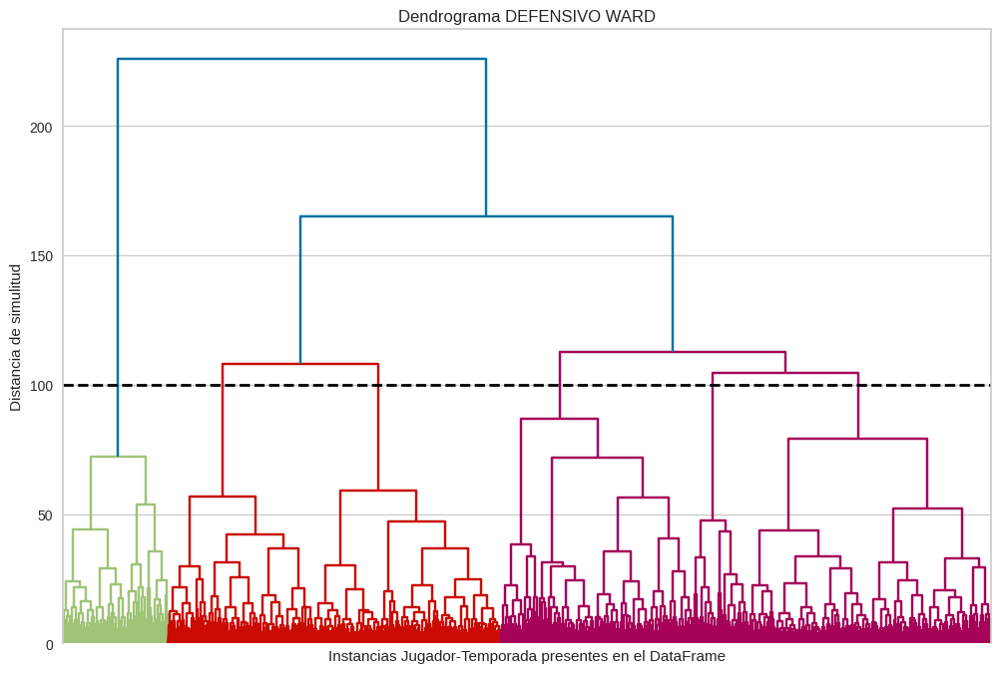

In [ ]:
# Dendrograma representando posibles arquetipos DEFENSIVOS:

def_arch_raw = cluster.hierarchy.linkage(def_scaled, method = "ward")
plt.figure(figsize=(12, 8))
cluster.hierarchy.dendrogram(def_arch_raw)

plt.xticks([])
plt.gca().spines['bottom'].set_visible(False)

plt.xlabel("Instancias Jugador-Temporada presentes en el DataFrame")
plt.ylabel("Distancia de simulitud")
plt.title('Dendrograma DEFENSIVO WARD')
plt.axhline(y=100, c='black', lw=2, linestyle='dashed') #Linea de partición

plt.show()

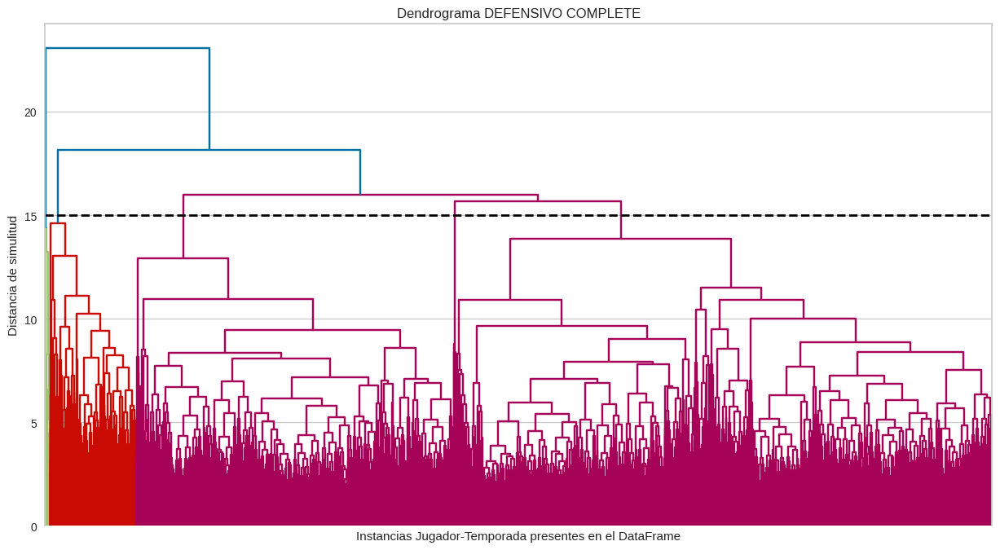

In [ ]:
# Dendrograma representando posibles arquetipos DEFENSIVOS:

def_arch_scaled = cluster.hierarchy.linkage(def_scaled, method = "complete")
plt.figure(figsize=(15, 8))
cluster.hierarchy.dendrogram(def_arch_scaled)

plt.xticks([])
plt.gca().spines['bottom'].set_visible(False)

plt.xlabel("Instancias Jugador-Temporada presentes en el DataFrame")
plt.ylabel("Distancia de simulitud")
plt.title('Dendrograma DEFENSIVO COMPLETE')
plt.axhline(y=15, c='black', lw=2, linestyle='dashed') #Linea de partición
plt.show()

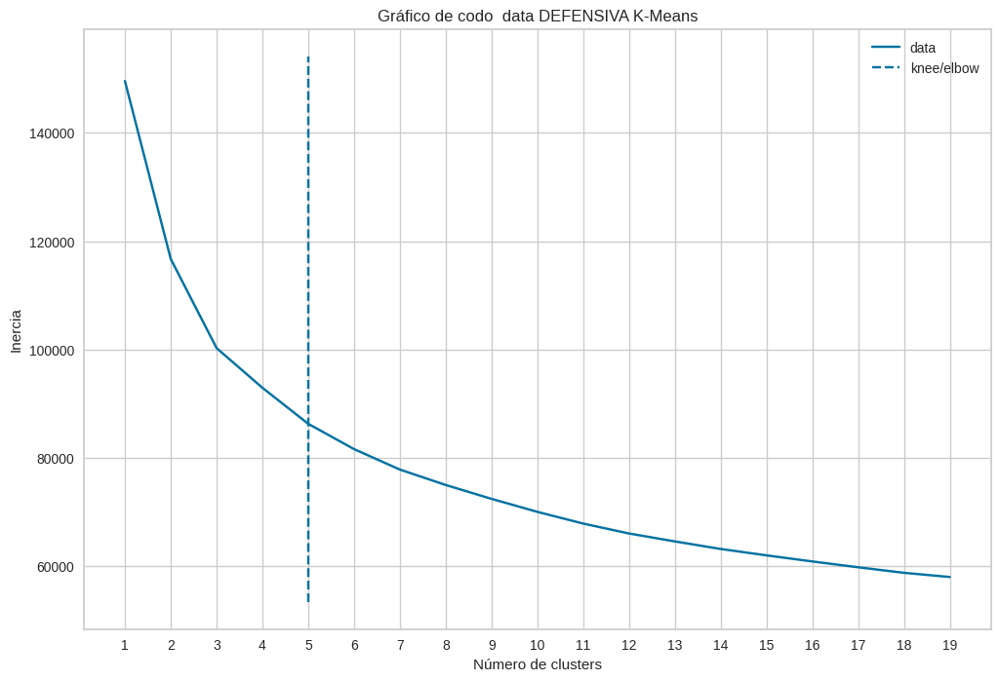

In [ ]:
# Ejecución de la función para mostrar gráfico de dataset DEF

optimize_k_means(def_scaled, 20, name=" data DEFENSIVA K-Means")

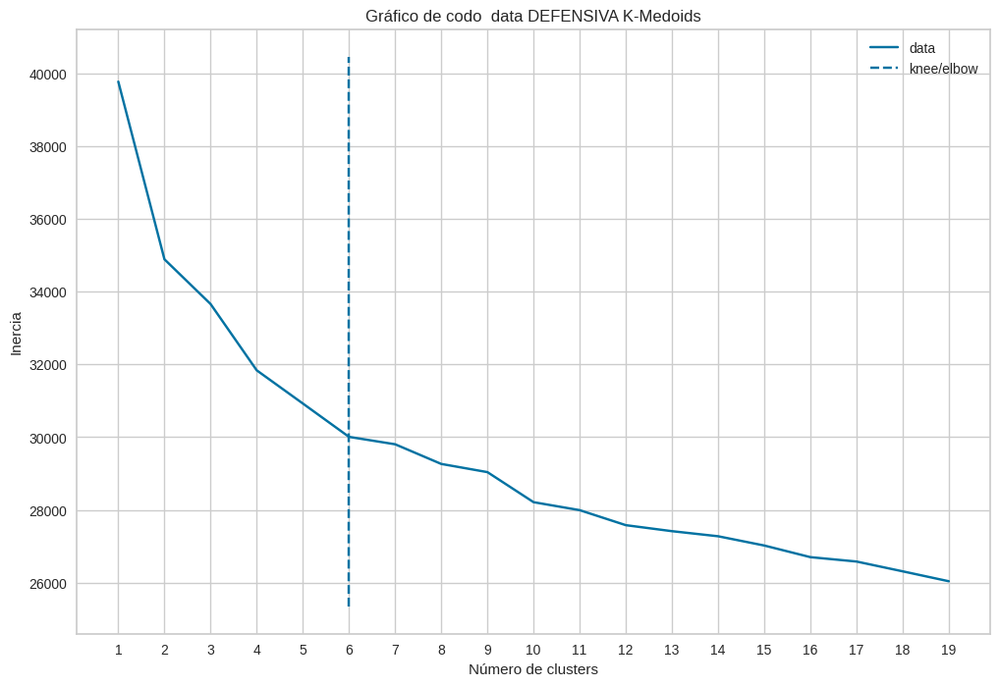

In [ ]:
optimize_k_medoids(def_scaled, 20, name=" data DEFENSIVA K-Medoids")

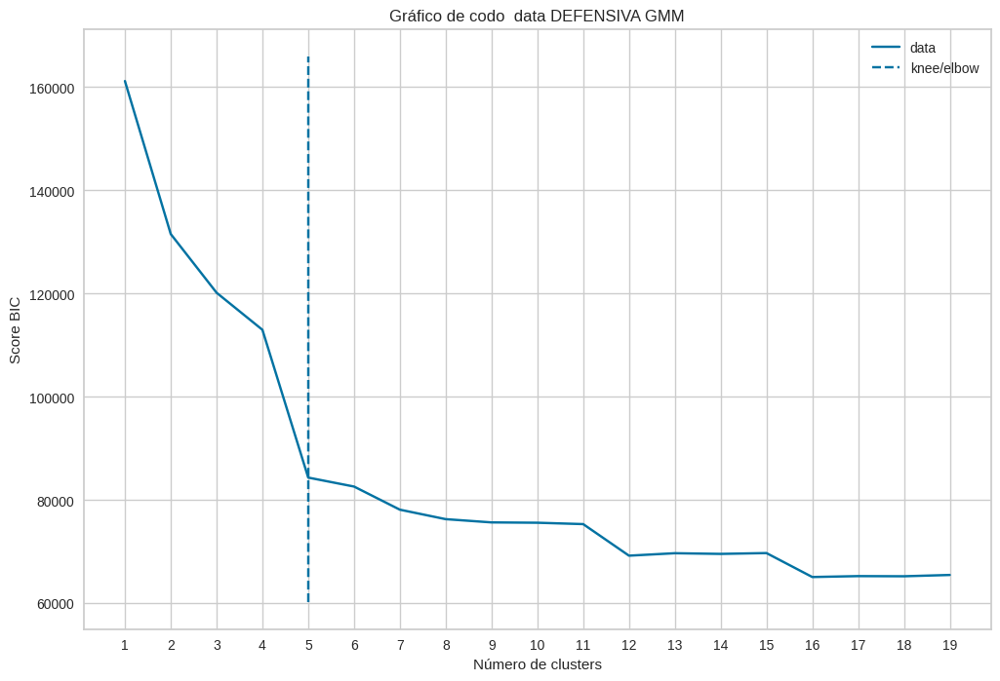

In [ ]:
optimize_gmm(def_scaled, max_components=20, name=" data DEFENSIVA GMM")

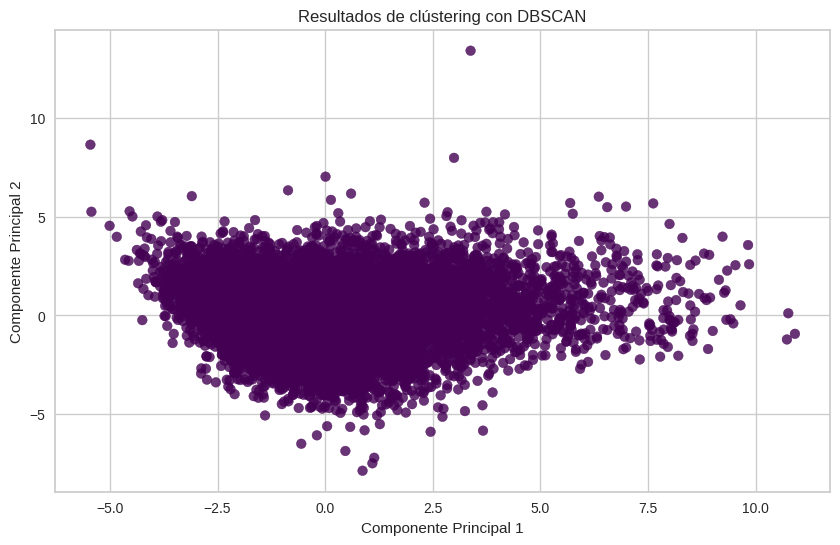

In [ ]:
# Intento inicial de clustering usando DBSCAN
# Apply DBSCAN
dbscan = DBSCAN(eps=0.9, min_samples=25)
labels = dbscan.fit_predict(def_scaled)

# Visualize some results (assuming two features for simplicity, adapt as needed)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(def_scaled)

# Scatter plot of the data colored by DBSCAN cluster labels
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.8)
plt.title('Resultados de clústering con DBSCAN')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.show()

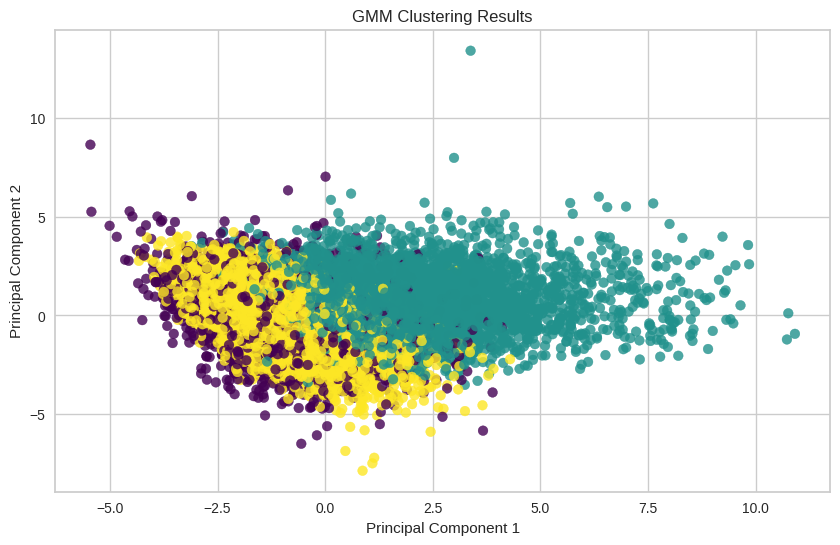

In [ ]:
# Fit GMM model
gmm = GaussianMixture(n_components=3, random_state=42)
gmm.fit(def_scaled)

# Predict cluster labels
labels = gmm.predict(def_scaled)

# Scatter plot of the data colored by GMM cluster labels
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.8)
plt.title('GMM Clustering Results')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

---
# 2.1. PCA Data Defensiva
---

In [ ]:
# Transposición de df para poder ejecutar PCA

trans_def_df = pd.DataFrame.transpose(def_scaled)
print(trans_def_df.shape)

(13, 11503)


Ratio de variabilidad:  [0.33334503 0.22058011]



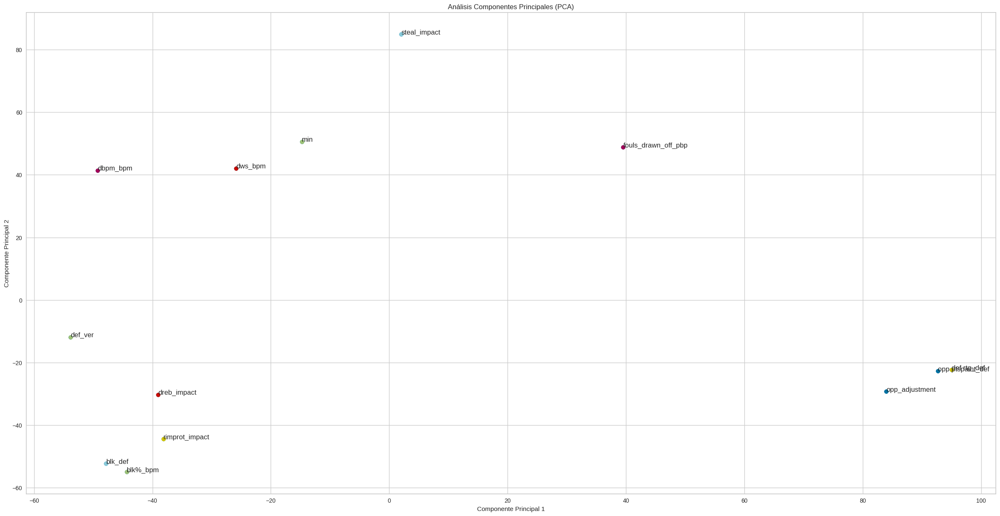

In [ ]:
estimator = PCA(n_components = 2)
features_pca = estimator.fit_transform(trans_def_df)
tags = list(trans_def_df.index)
colors = np.random.rand(0, len(tags))
print("Ratio de variabilidad: ", estimator.explained_variance_ratio_)
print("")

plt.figure(figsize=(30, 15))
plt.scatter(features_pca[:,0], features_pca[:,1])
plt.title("Análisis Componentes Principales (PCA)")
plt.ylabel("Componente Principal 2")
plt.xlabel("Componente Principal 1")

for name in tags:
    i = tags.index(name)
    labelpad = 0.01
    plt.text(features_pca[i,0]+labelpad, features_pca[i,1]+labelpad, name, fontsize=12)
    plt.scatter(features_pca[i,0], features_pca[i,1])

In [ ]:
# PCA con componentes CRUDOS

features = list(clus_def_data.columns)
x_def = clus_def_data.loc[:, features].values

In [ ]:
variance_list = []

for num_components in range(2, 13):
  pca = PCA(n_components = num_components)
  components = pca.fit_transform(x_def)
  var = sum(pca.explained_variance_ratio_)
  variance_list.append(var)
  print(num_components, "Exp var Ratio: ", var)

2 Exp var Ratio:  0.8716990763910755
3 Exp var Ratio:  0.9281783523618912
4 Exp var Ratio:  0.9572895756496995
5 Exp var Ratio:  0.9852637311912614
6 Exp var Ratio:  0.994587097113077
7 Exp var Ratio:  0.9988279858035571
8 Exp var Ratio:  0.9994044549618973
9 Exp var Ratio:  0.9997416280034063
10 Exp var Ratio:  0.9998636477386293
11 Exp var Ratio:  0.9999548437746054
12 Exp var Ratio:  1.0000000000000004


In [ ]:
pca = PCA(n_components = 8)
components = 8

# Generate labels for all components
pc_col_ls = [f'PC {i+1}' for i in range(components)]

comp = pca.fit_transform(x_def)
def_pca_df = pd.DataFrame(data = comp, columns = pc_col_ls)

def_pca_df["player"] = def_raw_df["player"]

In [ ]:
def_pca_df.head()

,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,player
0,-5.821758,2.596959,-0.759725,-3.249908,-1.638167,-1.001015,-0.508396,0.203591,AC Green
1,-9.081693,-8.768683,2.544459,-1.089685,-0.954517,-1.900510,0.728144,0.000727,Aaron McKie
2,-5.712641,3.945056,-5.765890,-0.661328,-3.425759,2.310009,0.302610,0.168573,Aaron Williams
3,-6.739904,0.375076,-4.867948,1.693727,-1.819254,2.082904,0.073838,0.188292,Acie Earl
4,-8.091756,-5.020914,0.784292,-1.190201,-0.157307,-0.257686,0.256083,-0.211332,Adam Keefe


In [ ]:
print(sum(pca.explained_variance_ratio_))

0.999404454961897


In [ ]:
# PCA con componentes ESCALADOS

features = list(def_scaled.columns)
x_def_scaled = def_scaled.loc[:, features].values

In [ ]:
variance_list = []

for num_components in range(2, 13):
  pca = PCA(n_components = num_components)
  components = pca.fit_transform(x_def_scaled)
  var = sum(pca.explained_variance_ratio_)
  variance_list.append(var)
  print(num_components, "Exp var Ratio: ", var)

2 Exp var Ratio:  0.5490029148023132
3 Exp var Ratio:  0.6683186908626413
4 Exp var Ratio:  0.7479175600318473
5 Exp var Ratio:  0.8183705956379935
6 Exp var Ratio:  0.874021071481465
7 Exp var Ratio:  0.9147367211029042
8 Exp var Ratio:  0.9410817272440853
9 Exp var Ratio:  0.9662750310435462
10 Exp var Ratio:  0.9862793993080228
11 Exp var Ratio:  0.9993316605008181
12 Exp var Ratio:  1.0


In [ ]:
pca_scaled_def = PCA(n_components = 10)
components = 10

# Generate labels for all components
pc_col_ls = [f'PC {i+1}' for i in range(components)]

comp = pca_scaled_def.fit_transform(x_def_scaled)
def_pca_scaled_df = pd.DataFrame(data = comp, columns = pc_col_ls)

def_pca_scaled_df["player"] = def_raw_df["player"]

In [ ]:
print(sum(pca_scaled_def.explained_variance_ratio_))

0.9862793993080232


In [ ]:
# Generación de Dataframes numéricos para clustering

num_def_pca_df = def_pca_df.drop('player', axis=1)
num_def_pca_scaled = def_pca_scaled_df.drop('player', axis=1)

---
## 2.1.2. Clustering de PCA DEFENSIVA
---

In [ ]:
# Ejecución de la función para mostrar gráfico de PCA DEF

# optimize_k_means(num_def_pca_scaled, 30, name=" PCA data DEFENSIVA")

---
# 2.2. Score de siluetas data Defensiva
---

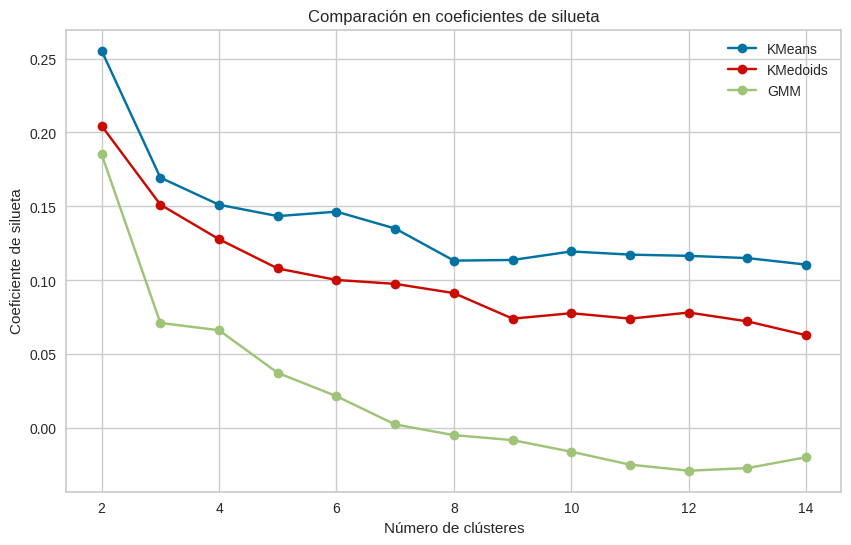

In [ ]:
# Gráfico comparando los resultados de Sil-Score con dataset Escalado y Crudo

compare_sil_scores(def_scaled, 15)

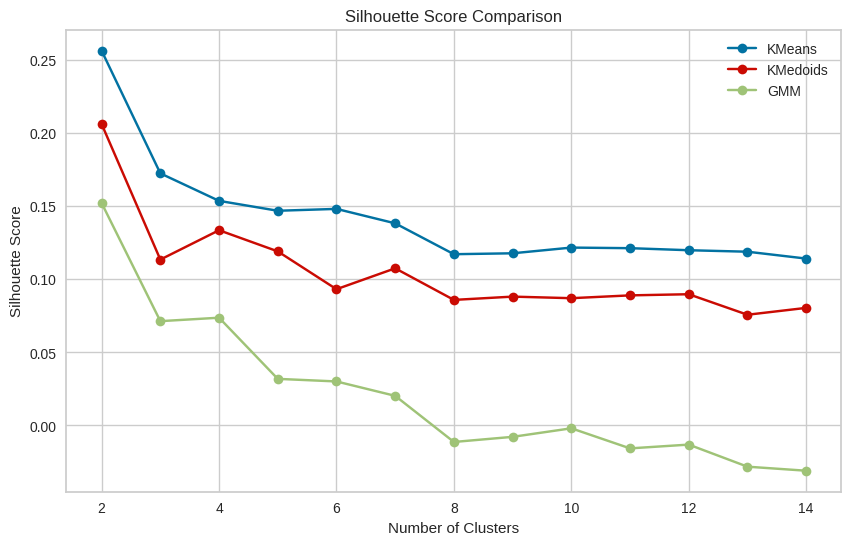

In [ ]:
# Gráfico comparando los resultados de Sil-Score con PCA Escalada

compare_sil_scores(num_def_pca_scaled, 15)

In [ ]:
# Opciones en número de cluster elegidas a partir de la gráfica:

def_clusnum_options = [5, 6, 9, 10]

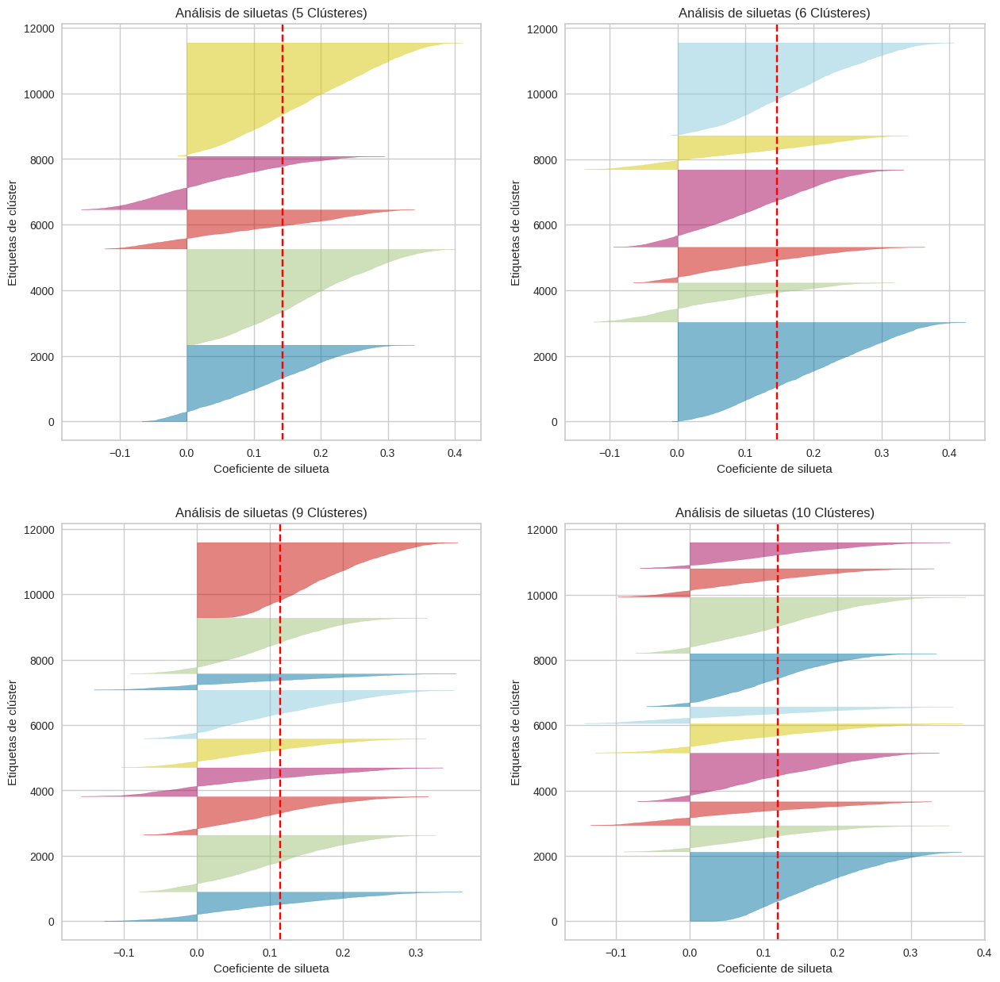

In [ ]:
visualize_sil_options(def_scaled, def_clusnum_options)

In [ ]:
visualize_sil_options(num_def_pca_df, def_clusnum_options)
print('')
visualize_sil_options(num_def_pca_scaled, def_clusnum_options)

---
# 3. Clustering inicial data OFENSIVA
---


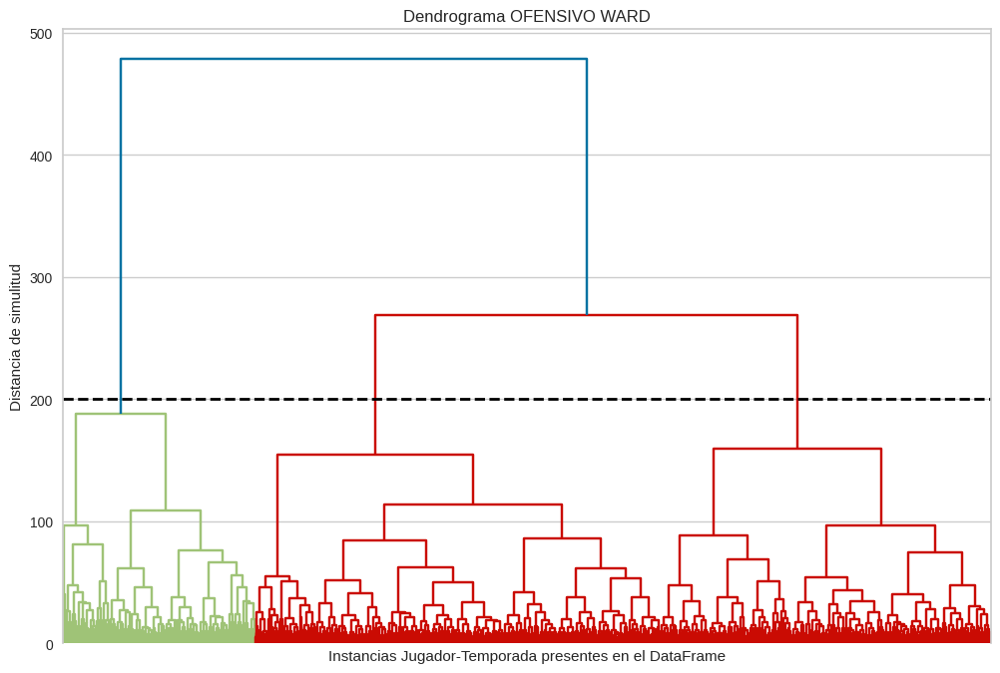

In [ ]:
# Dendrograma representando posibles arquetipos OFENSIVOS:

off_arch_scaled = cluster.hierarchy.linkage(off_scaled, method = "ward")
plt.figure(figsize=(12, 8))
cluster.hierarchy.dendrogram(off_arch_scaled)

plt.xticks([])
plt.gca().spines['bottom'].set_visible(False)

plt.xlabel("Instancias Jugador-Temporada presentes en el DataFrame")
plt.ylabel("Distancia de simulitud")
plt.title('Dendrograma OFENSIVO WARD')
plt.axhline(y=200, c='black', lw=2, linestyle='dashed') #Linea de partición
plt.show()

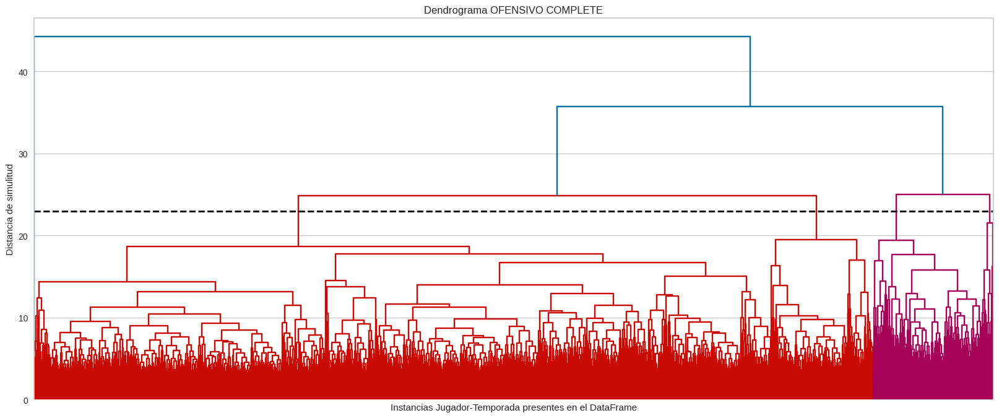

In [ ]:
# Dendrograma representando posibles arquetipos OFENSIVOS:

off_arch_scaled = cluster.hierarchy.linkage(off_scaled, method = "complete")
plt.figure(figsize=(20, 8))
cluster.hierarchy.dendrogram(off_arch_scaled)

plt.xticks([])
plt.gca().spines['bottom'].set_visible(False)

plt.xlabel("Instancias Jugador-Temporada presentes en el DataFrame")
plt.ylabel("Distancia de simulitud")
plt.title('Dendrograma OFENSIVO COMPLETE')
plt.axhline(y=23, c='black', lw=2, linestyle='dashed') #Linea de partición
plt.show()

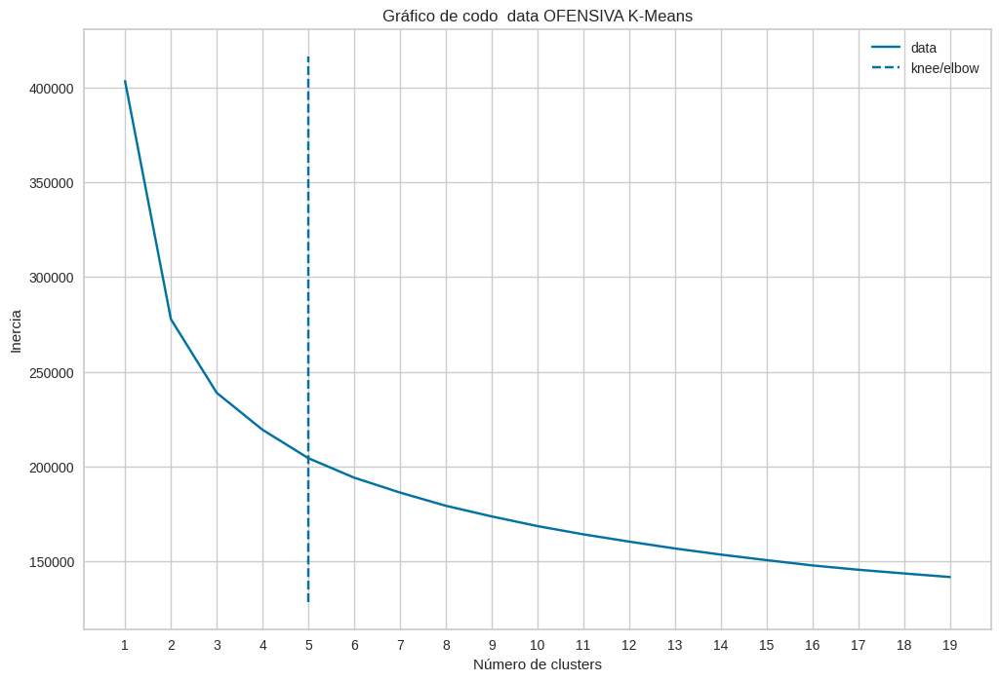

In [ ]:
# Ejecución de la función para mostrar gráfico de dataset OFF

optimize_k_means(off_scaled, 20, name=" data OFENSIVA K-Means")

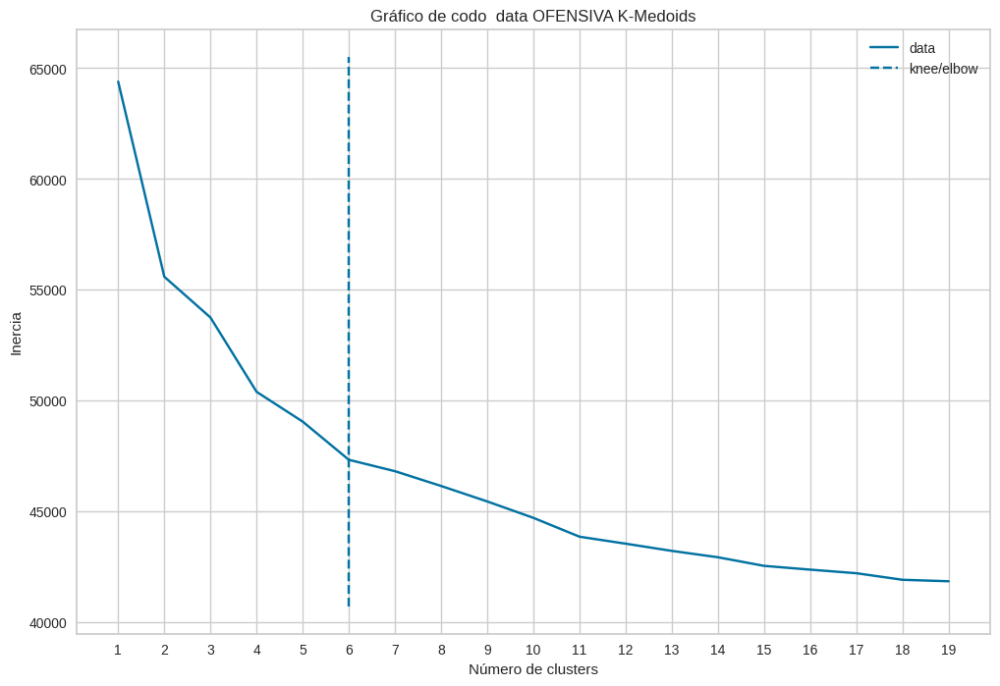

In [ ]:
optimize_k_medoids(off_scaled, 20, name=" data OFENSIVA K-Medoids")

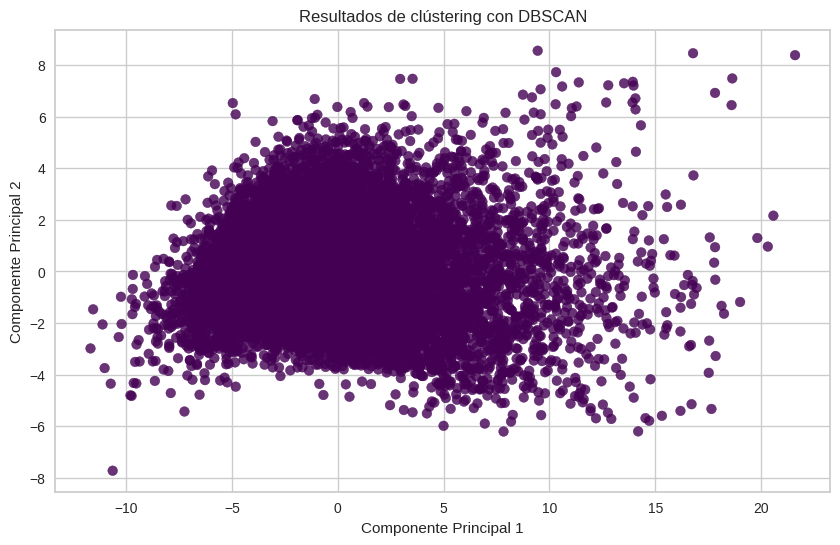

In [ ]:
# Intento inicial de clustering usando DBSCAN
# Apply DBSCAN
dbscan = DBSCAN(eps=0.05, min_samples=10)
labels = dbscan.fit_predict(off_scaled)

# Visualize some results (assuming two features for simplicity, adapt as needed)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(off_scaled)

# Scatter plot of the data colored by DBSCAN cluster labels
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.8)
plt.title('Resultados de clústering con DBSCAN')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.show()

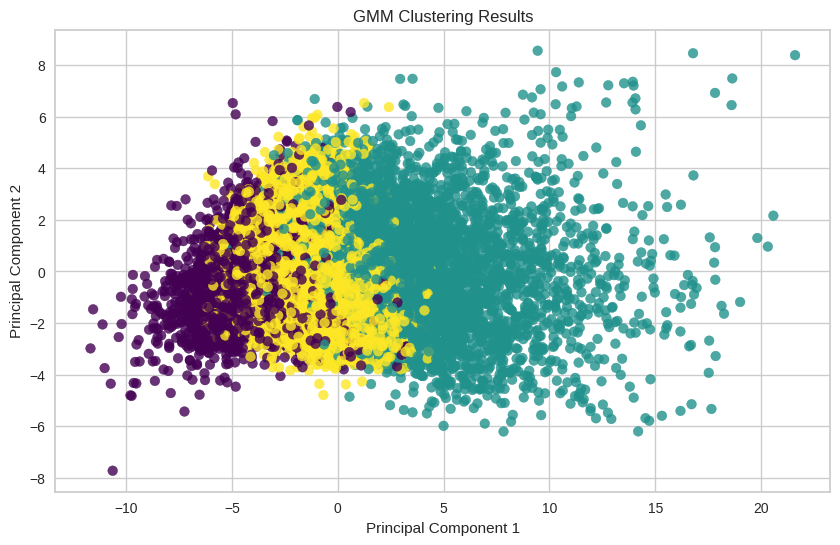

In [ ]:
# Fit GMM model
gmm = GaussianMixture(n_components=3, random_state=42)
gmm.fit(off_scaled)

# Predict cluster labels
labels = gmm.predict(off_scaled)

# Scatter plot of the data colored by GMM cluster labels
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.8)
plt.title('GMM Clustering Results')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

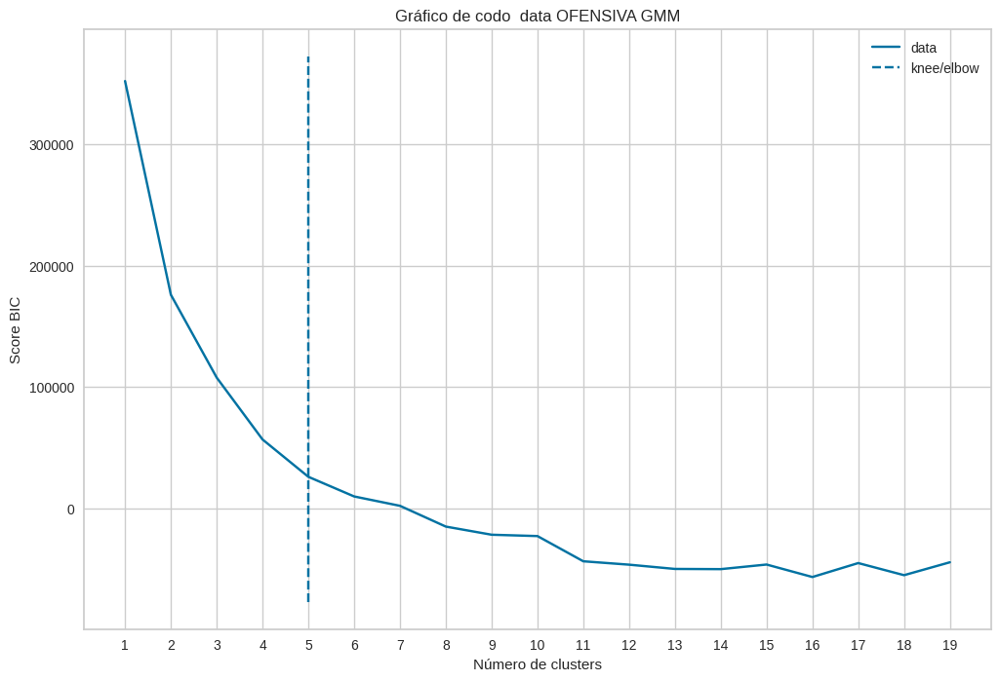

In [ ]:
optimize_gmm(off_scaled, max_components=20, name=" data OFENSIVA GMM")

---
# 3.1. PCA Data Ofensiva
---

In [ ]:
# Transposición de df para poder ejecutar PCA

trans_off_df = pd.DataFrame.transpose(off_scaled)
print(trans_off_df.shape)

(35, 11530)


Ratio de variabilidad:  [0.2207281  0.17533651]



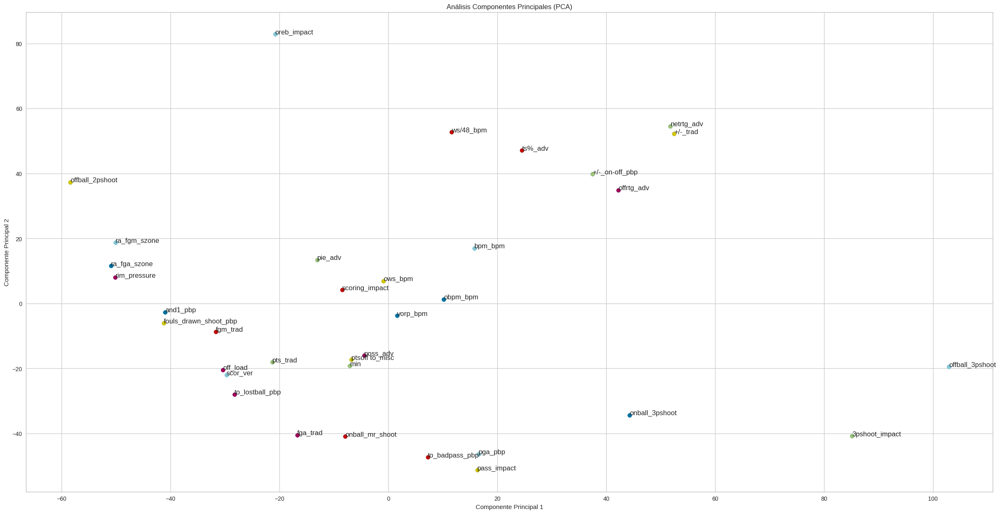

In [ ]:
estimator = PCA(n_components = 2)
features_pca = estimator.fit_transform(trans_off_df)
tags = list(trans_off_df.index)
colors = np.random.rand(0, len(tags))
print("Ratio de variabilidad: ", estimator.explained_variance_ratio_)
print("")

plt.figure(figsize=(30, 15))
plt.scatter(features_pca[:,0], features_pca[:,1])
plt.title("Análisis Componentes Principales (PCA)")
plt.ylabel("Componente Principal 2")
plt.xlabel("Componente Principal 1")

for name in tags:
    i = tags.index(name)
    labelpad = 0.01
    plt.text(features_pca[i,0]+labelpad, features_pca[i,1]+labelpad, name, fontsize=12)
    plt.scatter(features_pca[i,0], features_pca[i,1])

In [ ]:
# Otro intento para revisar con diferente número de componentes CRUDOS

features = list(clus_off_data.columns)
x_off = clus_off_data.loc[:, features].values

In [ ]:
variance_list = []

for num_components in range(2, 35):
  pca = PCA(n_components = num_components)
  components = pca.fit_transform(x_off)
  var = sum(pca.explained_variance_ratio_)
  variance_list.append(var)
  print(num_components, "Exp var Ratio: ", var)

2 Exp var Ratio:  0.9993210994986045
3 Exp var Ratio:  0.9998256957705977
4 Exp var Ratio:  0.9998817806347094
5 Exp var Ratio:  0.9999227704448046
6 Exp var Ratio:  0.9999432697405713
7 Exp var Ratio:  0.9999616536986061
8 Exp var Ratio:  0.9999714416597412
9 Exp var Ratio:  0.9999783063198229
10 Exp var Ratio:  0.9999837653560463
11 Exp var Ratio:  0.999988940125636
12 Exp var Ratio:  0.9999931622706499
13 Exp var Ratio:  0.999994863902381
14 Exp var Ratio:  0.9999963258839835
15 Exp var Ratio:  0.9999974303894489
16 Exp var Ratio:  0.999998061154324
17 Exp var Ratio:  0.9999984826710847
18 Exp var Ratio:  0.9999987895032555
19 Exp var Ratio:  0.9999990229840268
20 Exp var Ratio:  0.9999992280943708
21 Exp var Ratio:  0.9999994253712072
22 Exp var Ratio:  0.9999995835699689
23 Exp var Ratio:  0.9999997297216642
24 Exp var Ratio:  0.9999998463314784
25 Exp var Ratio:  0.9999998941565725
26 Exp var Ratio:  0.999999929288665
27 Exp var Ratio:  0.999999959590312
28 Exp var Ratio:  0.9999

In [ ]:
pca = PCA(n_components = 5)
components = 5

# Generate labels for all components
pc_col_ls = [f'PC {i+1}' for i in range(components)]

comp = pca.fit_transform(x_off)
off_pca_df = pd.DataFrame(data = comp, columns = pc_col_ls)

off_pca_df["player"] = off_raw_df["player"]

In [ ]:
off_pca_df.head()

,PC 1,PC 2,PC 3,PC 4,PC 5,player
0,2024.529193,-386.951291,-26.383908,-5.257683,17.366775,AC Green
1,449.094372,22.094575,-28.429322,1.451024,-4.531911,Aaron McKie
2,-1598.359995,-38.578477,13.827055,-2.855563,-2.559287,Aaron Williams
3,-1671.001678,-15.712404,15.870751,-8.922637,1.425101,Acie Earl
4,-895.391758,-93.622690,6.989331,10.479883,-7.159408,Adam Keefe


In [ ]:
print(sum(pca.explained_variance_ratio_))

0.9999227704448046


In [ ]:
# Otro intento para revisar con diferente número de componentes CRUDOS

features = list(off_scaled.columns)
x_off_scaled = off_scaled.loc[:, features].values

In [ ]:
variance_list = []

for num_components in range(2, 35):
  pca = PCA(n_components = num_components)
  components = pca.fit_transform(x_off_scaled)
  var = sum(pca.explained_variance_ratio_)
  variance_list.append(var)
  print(num_components, "Exp var Ratio: ", var)

2 Exp var Ratio:  0.6062078791508327
3 Exp var Ratio:  0.7010046590548414
4 Exp var Ratio:  0.7618372644640047
5 Exp var Ratio:  0.8023059779840456
6 Exp var Ratio:  0.8338050989022416
7 Exp var Ratio:  0.8606100820687261
8 Exp var Ratio:  0.8810824042122799
9 Exp var Ratio:  0.8993475541252489
10 Exp var Ratio:  0.9136000212558756
11 Exp var Ratio:  0.9248875596682322
12 Exp var Ratio:  0.9358588233152156
13 Exp var Ratio:  0.9462149263137418
14 Exp var Ratio:  0.9547566570384448
15 Exp var Ratio:  0.9624746353781156
16 Exp var Ratio:  0.9700622815893085
17 Exp var Ratio:  0.9747698722574968
18 Exp var Ratio:  0.9788481528601811
19 Exp var Ratio:  0.982853380635972
20 Exp var Ratio:  0.986356206707736
21 Exp var Ratio:  0.9890748885012605
22 Exp var Ratio:  0.9912333146577555
23 Exp var Ratio:  0.993027927147424
24 Exp var Ratio:  0.9944966369388857
25 Exp var Ratio:  0.9956071555614465
26 Exp var Ratio:  0.9965883893240105
27 Exp var Ratio:  0.9973497289709117
28 Exp var Ratio:  0.99

In [ ]:
pca = PCA(n_components = 20)
components = 20

# Generate labels for all components
pc_col_ls = [f'PC {i+1}' for i in range(components)]

comp = pca.fit_transform(x_off_scaled)
off_pca_scaled_df = pd.DataFrame(data = comp, columns = pc_col_ls)

off_pca_scaled_df["player"] = off_raw_df["player"]

In [ ]:
off_pca_scaled_df.head()

,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,...,PC 12,PC 13,PC 14,PC 15,PC 16,PC 17,PC 18,PC 19,PC 20,player
0,-0.971412,-1.602915,-0.541125,-1.944595,1.877989,-0.705286,-0.673133,0.371362,0.695602,-0.433091,...,0.283760,0.600979,0.140201,0.451159,0.452273,0.243916,-0.403435,0.488140,-0.162294,AC Green
1,-0.977249,1.953017,-0.950474,-1.195274,0.215992,0.502380,-0.461679,0.547375,-0.708663,-0.283330,...,0.373805,0.019805,-0.608046,0.180450,0.083445,-0.017854,-0.168539,0.034446,-0.066199,Aaron McKie
2,-1.017624,-2.889143,-1.210855,1.184403,1.410455,0.703342,0.235737,-0.077653,-0.028538,-1.627291,...,-0.687816,0.712594,0.658824,0.103241,-0.737963,0.261056,0.310247,-0.300496,-0.643133,Aaron Williams
3,-3.408427,-1.871330,1.429951,0.704026,-1.294805,1.136549,0.320283,0.538253,-0.604700,-0.017108,...,0.238068,-0.151184,0.373193,0.481087,-0.236881,0.321675,-0.082515,0.424762,0.427909,Acie Earl
4,-1.919845,-0.412847,-3.003558,-0.638646,0.105103,0.819173,0.190459,-0.139214,-0.082960,0.619098,...,0.681306,-0.411542,-0.647838,-0.292300,0.637651,-0.050587,-0.078168,0.188171,-0.022880,Adam Keefe


In [ ]:
print(sum(pca.explained_variance_ratio_))

0.9863562066823666


In [ ]:
# Generación de Dataframes numéricos para clustering

num_off_pca_df = off_pca_df.drop('player', axis=1)
num_off_pca_scaled = off_pca_scaled_df.drop('player', axis=1)

---
## 3.1.1. Clustering inicial PCA OFENSIVA
---

In [ ]:
# Ejecución de la función para mostrar gráfico de PCA DEF

#optimize_k_means(num_off_pca_scaled, 30, name=" PCA data OFENSIVA")

---
# 3.2. Score de siluetas data Ofensiva
---

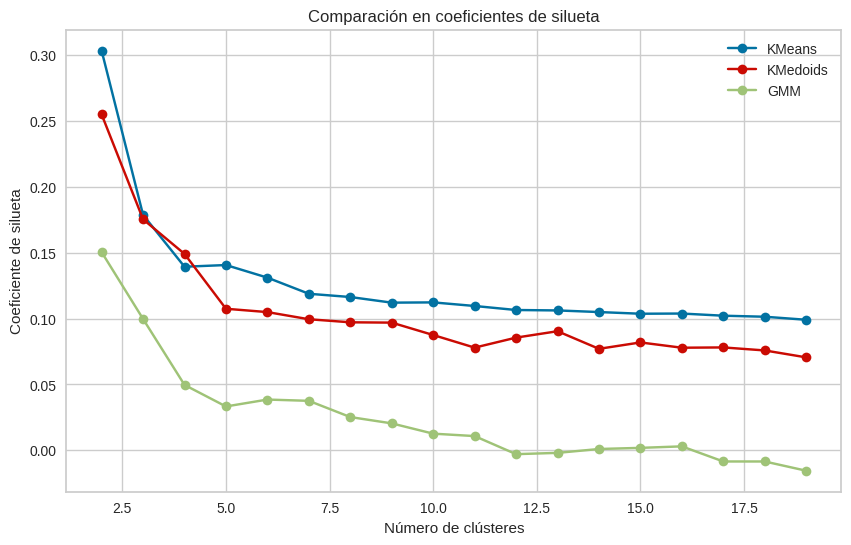

In [ ]:
# Gráfico comparando los resultados de Sil-Score con dataset completo y con PCA

compare_sil_scores(off_scaled, 20)

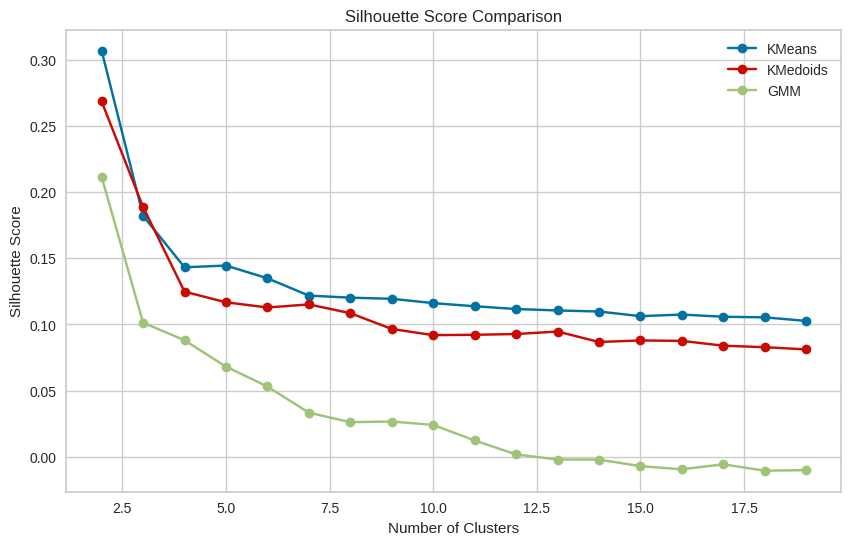

In [ ]:
# Gráfico comparando los resultados de Sil-Score con dataset completo y con PCA

compare_sil_scores(num_off_pca_scaled, 20)

In [ ]:
# Opciones en número de cluster elegidas a partir de la gráfica:

off_clusnum_options = [5, 6, 8, 10]

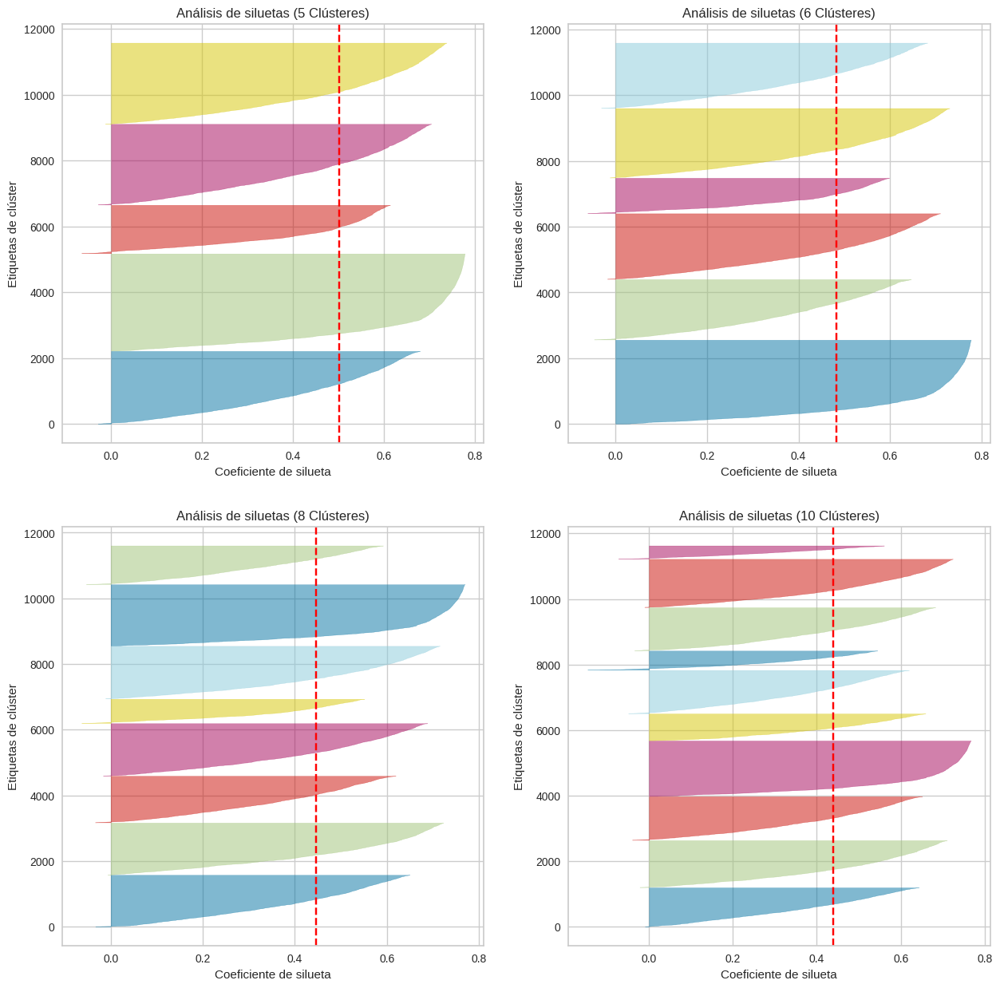

In [ ]:
visualize_sil_options(clus_off_data, off_clusnum_options)

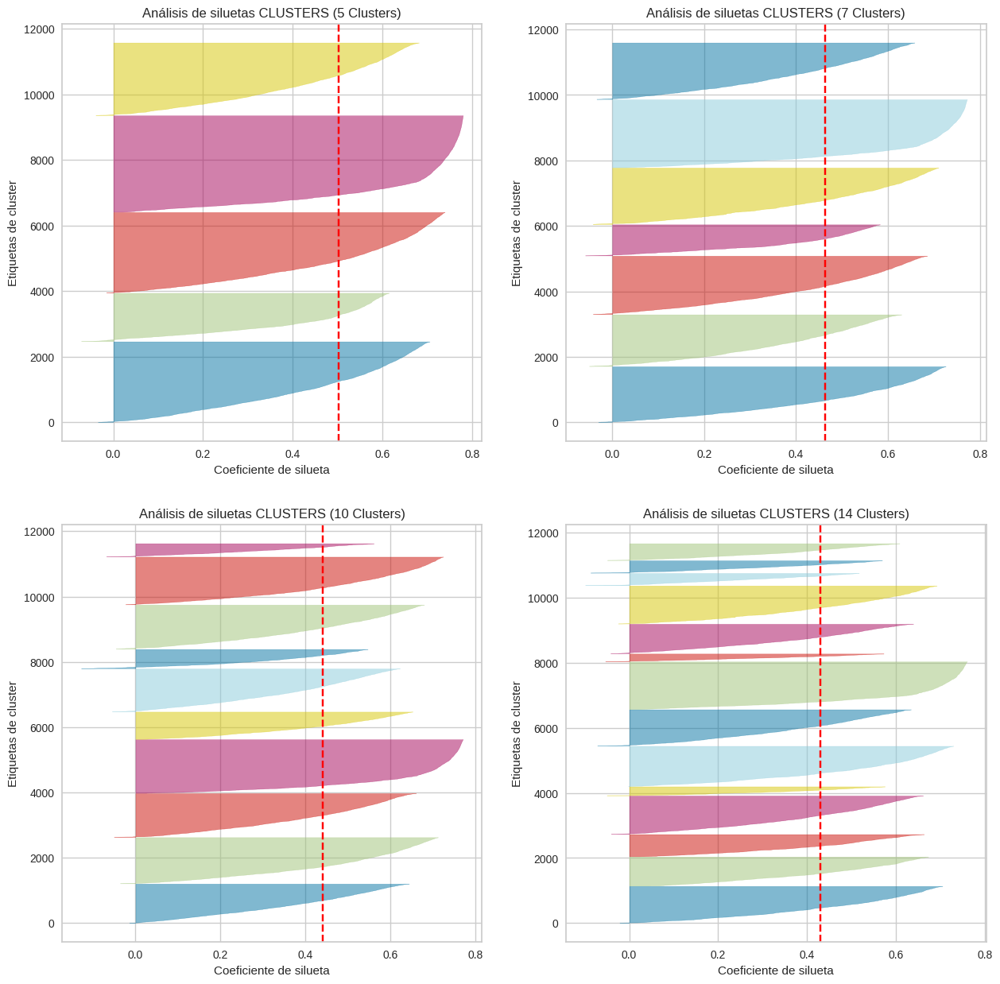

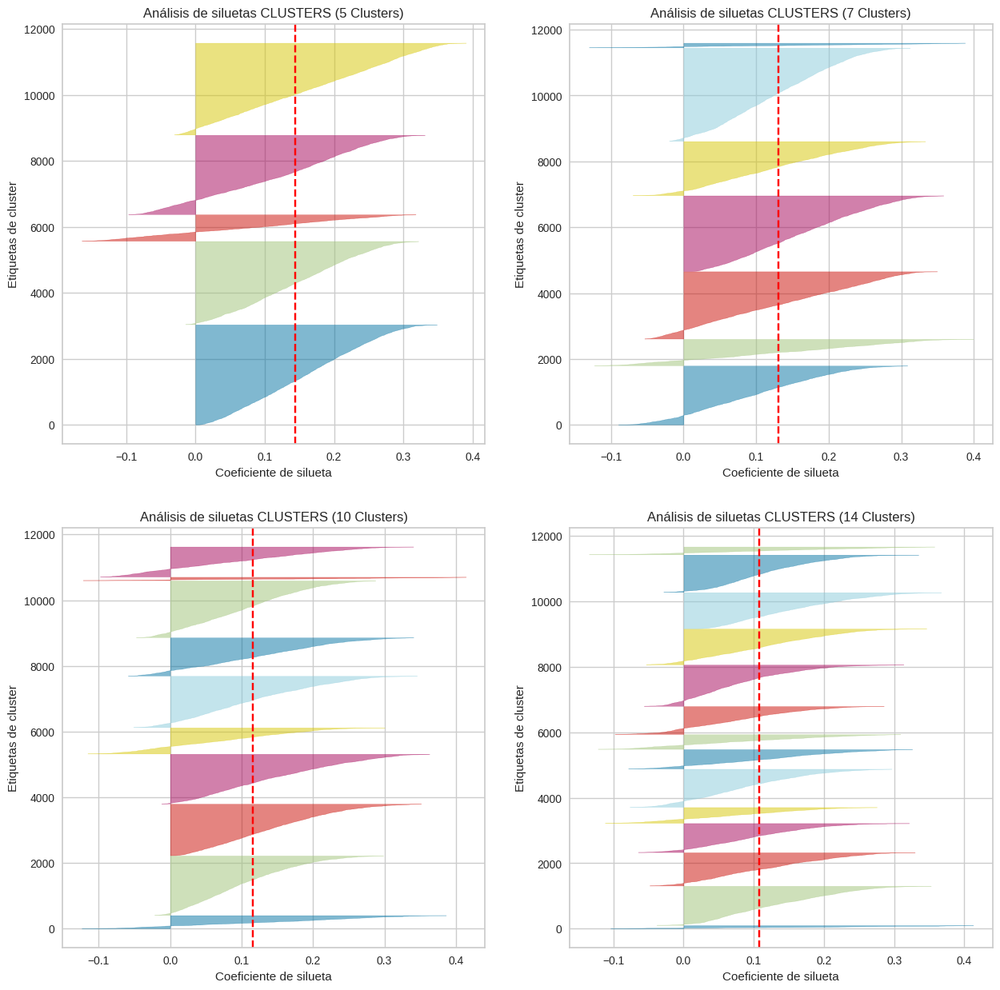

In [ ]:
visualize_sil_options(num_off_pca_df, off_clusnum_options)
print('')
visualize_sil_options(num_off_pca_scaled, off_clusnum_options)

---
# 4.0. Números de cluster DEFENSIVOS para profundizar
---

In [27]:
def_clusnum_a = 9 # KMEANS 0.36-0.65
def_clusnum_b = 10 # KMEANS 0.36-0.64
def_clusnum_c = 7 # KMEDIOIDS 0.36-0.67

---
# 4. Definición inicial de arquetipos DEFENSIVOS
---

In [ ]:
# Se hace clustering con 6 por ser el mejor score de silueta y punto de codo en dataset con PCA


kmeans = KMeans(n_clusters=def_pca_clusnum, random_state=42, n_init=10)

kmeans.fit(num_def_pca_scaled)

y_kmeans_def = kmeans.predict(num_def_pca_scaled)

In [ ]:
y_kmeans_def

array([3, 5, 3, ..., 0, 0, 3], dtype=int32)

In [ ]:
def_raw_df.columns

Index(['player', 'season', 'pos_bpm', 'min', 'dreb_impact',
       'fouls_drawn_off_pbp', 'rimprot_impact', 'steal_impact',
       'opp_adjustment', 'blk%_bpm', 'dws_bpm', 'dbpm_bpm', 'def rtg_def',
       'blk_def', 'opp ptspaint_def', 'def_ver'],
      dtype='object')

In [ ]:
evaluation_columns = ['player', 'season', 'min', 'pos_bpm', 'dreb_impact', 'rimprot_impact', 'steal_impact',
                      'opp_adjustment', 'def_ver', 'dbpm_bpm']

kmeans_def_arch = def_raw_df[evaluation_columns]

In [ ]:
kmeans_def_arch = kmeans_def_arch.copy()

kmeans_def_arch["def_archetype"] = y_kmeans_def

In [ ]:
kmeans_def_arch

,player,season,min,pos_bpm,dreb_impact,rimprot_impact,steal_impact,opp_adjustment,def_ver,dbpm_bpm,def_archetype
0,AC Green,1997,53.1,4,0.575829,0.095971,0.060940,2.97662,0.732740,-0.4,3
1,Aaron McKie,1997,52.7,2,0.324645,0.162318,0.250989,2.08580,0.737952,2.0,5
2,Aaron Williams,1997,53.0,45,0.452607,0.376297,0.070664,3.28176,0.899567,-0.6,3
3,Acie Earl,1997,50.7,5,0.367299,0.447587,0.048268,3.04360,0.863153,-0.2,3
4,Adam Keefe,1997,51.9,5,0.492891,0.129623,0.103927,2.15708,0.726441,0.3,1
...,...,...,...,...,...,...,...,...,...,...,...
11498,Zach Collins,2023,46.2,5,0.497053,0.251635,0.064423,3.30320,0.813110,0.3,3
11499,Zach LaVine,2023,48.1,2,0.218075,0.113772,0.060893,2.49798,0.392739,-0.7,0
11500,Zeke Nnaji,2023,48.9,4,0.190570,0.212987,0.047320,2.84100,0.450877,-0.9,0
11501,Ziaire Williams,2023,46.9,3,0.212181,0.129633,0.053218,3.03906,0.395032,-0.8,0


In [ ]:
kmeans_def_arch["def_archetype"].value_counts()

0    3031
1    2817
3    2289
5    1170
2    1137
4    1059
Name: def_archetype, dtype: int64

In [ ]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

def_arch_grouped = kmeans_def_arch.groupby('def_archetype').agg({
    'player': 'count',
    'min': 'median',
    'dreb_impact': 'median',
    'rimprot_impact': 'median',
    'steal_impact': 'median',
    'opp_adjustment': 'median',
    'dbpm_bpm': 'median',
    'def_ver': 'median',
}).reset_index()

def_arch_grouped['random_players'] = kmeans_def_arch.groupby('def_archetype')['player'].apply(lambda x: x.sample(n=5, random_state=97012).tolist())

In [ ]:
def_arch_grouped

,def_archetype,player,min,dreb_impact,rimprot_impact,steal_impact,opp_adjustment,dbpm_bpm,def_ver,random_players
0,0,3031,48.9,0.213508,0.079160,0.093119,2.85458,-1.00,0.424102,"[Harrison Barnes, Ramon Sessions, Max Strus, A..."
1,1,2817,51.1,0.275210,0.080935,0.121954,2.36587,-0.20,0.521556,"[Tyrone Hill, Rasual Butler, Carlos Arroyo, Da..."
2,2,1137,50.9,0.582938,0.438154,0.087010,2.47904,1.20,1.142878,"[Arvydas Sabonis, Dan Gadzuric, Luke Kornet, S..."
3,3,2289,49.8,0.515464,0.219683,0.081737,2.73456,-0.10,0.841257,"[Dwight Powell, Trevor Booker, Shaquille O'Nea..."
4,4,1059,49.3,0.253041,0.119839,0.163296,2.56962,0.10,0.595134,"[Royce O'Neale, Desmond Mason, Terance Mann, J..."
5,5,1170,50.7,0.305215,0.114875,0.392069,2.36255,1.25,0.846394,"[Travis Best, Sasha Vujacic, Robert Horry, Jas..."


In [ ]:
kmeans_def_arch["def_archetype"] = kmeans_def_arch["def_archetype"].astype(str)

In [ ]:
# Gráfico comparativo de arquetipos

def_fig = px.scatter(kmeans_def_arch, x="def_ver", y="rimprot_impact", color="def_archetype", size="dreb_impact", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Defensive Archetypes Comparison",
                 labels={"%blk_def": "Porcentaje de bloqueos", "dreb_def": "Rebotes defensivos"},
                 hover_name="player")

# Show the Plotly figure
def_fig.show()

---
## 4.0.1. Intento con K-MEANS y dataset completo en lugar de PCA
---

In [ ]:
# Se hace clustering con 6 por ser el que mejor se ve en gráfico de YELLOWBRICK


kmeans = KMeans(n_clusters=def_raw_clusnum, random_state=42, n_init=10)

kmeans.fit(def_scaled) # Dataset crudo

y_kmeans_rawdef = kmeans.predict(def_scaled)

In [ ]:
y_kmeans_rawdef

array([1, 4, 1, ..., 6, 6, 1], dtype=int32)

In [ ]:
evaluation_columns = ['player', 'season', 'min', 'pos_bpm', 'dreb_impact', 'rimprot_impact', 'steal_impact',
                      'opp_adjustment', 'def_ver', 'dbpm_bpm']

kmeans_def_arch = def_raw_df[evaluation_columns]

In [ ]:
kmeans_def_arch = kmeans_def_arch.copy()

kmeans_def_arch["def_archetype"] = y_kmeans_rawdef

In [ ]:
kmeans_def_arch.head(3)

,player,season,min,pos_bpm,dreb_impact,rimprot_impact,steal_impact,opp_adjustment,def_ver,dbpm_bpm,def_archetype
0,AC Green,1997,53.1,4,0.575829,0.095971,0.060940,2.97662,0.732740,-0.4,1
1,Aaron McKie,1997,52.7,2,0.324645,0.162318,0.250989,2.08580,0.737952,2.0,4
2,Aaron Williams,1997,53.0,45,0.452607,0.376297,0.070664,3.28176,0.899567,-0.6,1


In [ ]:
kmeans_def_arch["def_archetype"].value_counts()

3    2678
6    2564
1    1799
2    1523
0    1044
4    1001
5     894
Name: def_archetype, dtype: int64

In [ ]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

def_arch_grouped = kmeans_def_arch.groupby('def_archetype').agg({
    'player': 'count',
    'min': 'median',
    'dreb_impact': 'median',
    'rimprot_impact': 'median',
    'steal_impact': 'median',
    'opp_adjustment': 'median',
    'dbpm_bpm': 'median',
    'def_ver': 'median',
}).reset_index()

def_arch_grouped['random_players'] = kmeans_def_arch.groupby('def_archetype')['player'].apply(lambda x: x.sample(n=5, random_state=9701).tolist())

In [ ]:
def_arch_grouped

,def_archetype,player,min,dreb_impact,rimprot_impact,steal_impact,opp_adjustment,dbpm_bpm,def_ver,random_players
0,0,1044,49.3,0.255569,0.119188,0.165990,2.572970,0.1,0.595763,"[Devin Booker, Tre Jones, Paul Pierce, Justise..."
1,1,1799,48.8,0.490610,0.216611,0.077175,2.840870,-0.2,0.809281,"[Jeremy Evans, Aaron Williams, Cole Aldrich, D..."
2,2,1523,51.3,0.516432,0.206028,0.107720,2.394790,0.4,0.855218,"[Brandon Bass, Amar'e Stoudemire, Ekpe Udoh, K..."
3,3,2678,50.9,0.244589,0.069800,0.129348,2.423280,-0.3,0.480842,"[Dejounte Murray, Jaren Jackson, David Nwaba, ..."
4,4,1001,50.6,0.278388,0.100817,0.424642,2.369130,1.2,0.828053,"[Gerald Wallace, Manu Ginobili, Shaun Livingst..."
5,5,894,50.8,0.588590,0.486924,0.083765,2.547800,1.3,1.199489,"[Hakeem Olajuwon, Darko Milicic, Etan Thomas, ..."
6,6,2564,48.8,0.208426,0.077487,0.087361,2.884345,-1.1,0.415141,"[Lawrence Moten, Reggie Jackson, Klay Thompson..."


In [ ]:
kmeans_def_arch["def_archetype"] = kmeans_def_arch["def_archetype"].astype(str)

In [ ]:
# Gráfico comparativo de arquetipos

def_fig = px.scatter(kmeans_def_arch, x="def_ver", y="rimprot_impact", color="def_archetype", size="dreb_impact", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Defensive Archetypes Comparison",
                 labels={"%blk_def": "Porcentaje de bloqueos", "dreb_def": "Rebotes defensivos"},
                 hover_name="player")

# Show the Plotly figure
def_fig.show()

---
## 4.1. Definición inicial de arq DEFENSIVOS usando Clus. AGLOMERATIVO
---

In [ ]:
# Se hace clustering de 4 por ser aparentar ser la mejor división en dendrograma

aglomerative = AgglomerativeClustering(n_clusters=def_scaled_agloclusnum, linkage='ward')

aglomerative.fit(def_scaled)

y_aglo_def = aglomerative.labels_

In [ ]:
y_aglo_def

array([4, 0, 3, ..., 2, 2, 2])

In [ ]:
evaluation_columns = ['player', 'season', 'min', 'pos_bpm', 'dreb_impact', 'rimprot_impact', 'steal_impact',
                      'opp_adjustment', 'def_ver', 'dbpm_bpm']

aglo_def_arch = def_raw_df[evaluation_columns]

In [ ]:
aglo_def_arch = aglo_def_arch.copy()

aglo_def_arch["def_archetype"] = y_aglo_def

In [ ]:
aglo_def_arch["def_archetype"].value_counts()

1    2985
0    2382
2    2337
4    1790
3    1312
5     697
Name: def_archetype, dtype: int64

In [ ]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

aglo_def_arch_grouped = aglo_def_arch.groupby('def_archetype').agg({
    'player': 'count',
    'min': 'median',
    'dreb_impact': 'median',
    'rimprot_impact': 'median',
    'steal_impact': 'median',
    'opp_adjustment': 'median',
    'def_ver': 'median',
    'dbpm_bpm': 'median',
}).reset_index()

aglo_def_arch_grouped['random_players'] = aglo_def_arch.groupby('def_archetype')['player'].apply(lambda x: x.sample(n=5, random_state=970120).tolist())

In [ ]:
aglo_def_arch_grouped

,def_archetype,player,min,dreb_impact,rimprot_impact,steal_impact,opp_adjustment,def_ver,dbpm_bpm,random_players
0,0,2382,51.30,0.407563,0.158782,0.169727,2.375765,0.799125,0.7,"[Marcin Gortat, Jeff Teague, Manu Ginobili, Ji..."
1,1,2985,50.10,0.240838,0.074240,0.156273,2.465280,0.513164,-0.2,"[Darrick Martin, Nenad Krstic, Patrick McCaw, ..."
2,2,2337,48.50,0.206161,0.075704,0.092124,2.824660,0.402185,-1.0,"[Rafer Alston, Awvee Storey, Dana Barros, Tyro..."
3,3,1312,50.45,0.571429,0.419778,0.074712,2.568055,1.102655,0.9,"[Taj Gibson, Jared Reiner, Sean Williams, Marc..."
4,4,1790,50.10,0.476483,0.173395,0.074611,2.861845,0.749124,-0.6,"[Daniel Gafford, Lorenzen Wright, Antawn Jamis..."
5,5,697,50.00,0.252874,0.121981,0.162674,2.660840,0.628297,0.0,"[Udonis Haslem, De'Aaron Fox, Brian Cardinal, ..."


In [ ]:
aglo_def_arch["def_archetype"] = aglo_def_arch["def_archetype"].astype(str)

In [ ]:
# Gráfico comparativo de arquetipos

def_fig = px.scatter(aglo_def_arch, x="def_ver", y="rimprot_impact", color="def_archetype", size="dreb_impact", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Defensive Archetypes Comparison",
                 labels={"%blk_def": "Porcentaje de bloqueos", "dreb_def": "Rebotes defensivos"},
                 hover_name="player")

# Show the Plotly figure
def_fig.show()

---
# 4.3. Análisis en resultados de clusters DEF (Corr)
---

In [ ]:
n_clusters_aglo = [3, 5, 6, 7]  # Lisado con números de cluster DEF AGLOMERATIVO
linkage_types = ['ward', 'complete']  # Listado con los dos tipos de enlace a utilizar

# Diccionario para guardar los diferentes tipos de combinaciones de parametros
labels_col_def_aglo = {}

for n_clusters in n_clusters_aglo:
    for linkage in linkage_types:
        labels = run_agglomerative_clustering(def_scaled, n_clusters, linkage)
        key = f'n_{n_clusters}_aglo_{linkage}'
        labels_col_def_aglo[key] = labels

KeyboardInterrupt: 

In [ ]:
n_clusters_kmeans = [5, 6, 9, 10]  # Lisado con números de cluster DEF KMEANS

# Diccionario para guardar los diferente número de clusters
labels_col_def_kmeans = {}

for n_clusters in n_clusters_kmeans:
      labels = run_kmeans_clustering(def_scaled, n_clusters)
      key = f'n_{n_clusters}_kmeans'
      labels_col_def_kmeans[key] = labels

In [ ]:
n_clusters_kmedioids = [4, 6, 7, 10]  # Lisado con números de cluster DEF KMEDIOIDS

# Diccionario para guardar los diferente número de clusters
labels_col_def_kmedioids = {}

for n_clusters in n_clusters_kmedioids:
      labels = run_kmedoids_clustering(def_scaled, n_clusters)
      key = f'n_{n_clusters}_kmedoids'
      labels_col_def_kmedioids[key] = labels

In [ ]:
n_clusters_gmm = [4, 5, 8, 10]  # Lisado con números de cluster DEF GMM

# Diccionario para guardar los diferente número de clusters
labels_col_def_gmm = {}

for n_clusters in n_clusters_gmm:
      labels = run_gmm_clustering(def_scaled, n_clusters)
      key = f'n_{n_clusters}_gmm'
      labels_col_def_gmm[key] = labels

In [ ]:
labels_col_def_aglo

In [ ]:
def_comp_columns = ['player', 'season', 'min', 'def_ver', 'dreb_impact', 'rimprot_impact', 'steal_impact',
                    'dws_bpm',  'dbpm_bpm']

In [ ]:
def_arch_comp_df = def_raw_df[def_comp_columns]

In [ ]:
def_arch_comp_df.head(3)

In [ ]:
#%%capture

def_arch_comp_df = add_columns_from_dict(def_arch_comp_df, labels_col_def_aglo)
def_arch_comp_df = add_columns_from_dict(def_arch_comp_df, labels_col_def_kmeans)
def_arch_comp_df = add_columns_from_dict(def_arch_comp_df, labels_col_def_kmedioids)
def_arch_comp_df = add_columns_from_dict(def_arch_comp_df, labels_col_def_gmm)

In [ ]:
def_arch_comp_df.columns.values

In [ ]:
%%capture

cluster_cols = ['n_3_aglo_ward', 'n_3_aglo_complete', 'n_5_aglo_ward',
                'n_5_aglo_complete', 'n_6_aglo_ward', 'n_6_aglo_complete',
                'n_7_aglo_ward', 'n_7_aglo_complete', 'n_5_kmeans', 'n_6_kmeans',
                'n_9_kmeans', 'n_10_kmeans', 'n_4_kmedoids', 'n_6_kmedoids',
                'n_7_kmedoids', 'n_10_kmedoids', 'n_4_gmm', 'n_5_gmm', 'n_8_gmm',
                'n_10_gmm', 'pos_bpm']

value_col = 'dbpm_bpm'

organized_data_test = organize_clusters_by_median(def_arch_comp_df, cluster_cols, value_col)

In [ ]:
organized_data_test.head(3)

In [ ]:
org_columns = list(filter(lambda col: 'org_' in col, organized_data_test.columns))
org_columns.append('dbpm_bpm')

In [ ]:
# Mapa de calor para revisar correlaciones con variable DBPM

corr = organized_data_test[org_columns].corr(numeric_only = True)
dbpm_corr = corr[["dbpm_bpm"]]
sbrn.set(rc = {'figure.figsize':(8, 12)})
heatmap = sbrn.heatmap(dbpm_corr.sort_values(by = ["dbpm_bpm"], ascending = False), annot = True)
plt.title('Correlaciones con BPM DEFENSIVO Temporada Regular')

In [ ]:
# Creating a figure with three subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# Plotting boxplots for each type of clustering algorithm
for i, col in enumerate(['org_n_10_kmedoids', 'org_n_9_kmeans', 'org_n_7_kmedoids']):
    sbrn.boxplot(x=col, y='dbpm_bpm', data=def_arch_comp_df, ax=axes[i])
    axes[i].set_title(f'Defensive Archetypes ({col})')
    axes[i].set_xlabel('Defensive Archetype')
    axes[i].set_ylabel('dbpm_bpm')

plt.tight_layout()
plt.show()

Correlaciones con DBPM

In [ ]:
# Importación de archivo con data de playoffs

playoff_dbpm_df = pd.read_csv(base_folder_string + 'def_ext_feature_analysis_newvar.csv')
playoff_dbpm_df.shape

In [ ]:
playoff_dbpm_df = playoff_dbpm_df[['player', 'season', 'pos_bpm', 'dbpm_playoffs']]

In [ ]:
def_arch_comp_merged = pd.merge(def_arch_comp_df, playoff_dbpm_df, on = ['player', 'season'], how='inner', suffixes=('', '_drop'))

In [ ]:
def_arch_comp_merged.head(2)

In [ ]:
org_columns_playoffs = list(filter(lambda col: 'org_' in col, def_arch_comp_merged.columns))
added_poff_col = ['dbpm_bpm','pos_bpm', 'dbpm_playoffs']
for col in added_poff_col:
  org_columns_playoffs.append(col)

In [ ]:
# Mapa de calor para revisar correlaciones con variable DBPM PLAYOFFS

corr = def_arch_comp_merged[org_columns_playoffs].corr(numeric_only = True)
dbpm_corr = corr[["dbpm_playoffs"]]
sbrn.set(rc = {'figure.figsize':(8, 12)})
heatmap = sbrn.heatmap(dbpm_corr.sort_values(by = ["dbpm_playoffs"], ascending = False), annot = True)
plt.title('Correlaciones con BPM DEFENSIVO Playoffs')

---
# 4.4. Análisis en resultados de clusters DEF (Qual)
---

In [28]:
# KMEANS 0.36-0.65
kmeans = KMeans(n_clusters=def_clusnum_a, random_state=970120, n_init=10)
kmeans.fit(def_scaled)
y_kmeans_def_a = kmeans.predict(def_scaled)

In [29]:
y_kmeans_def_a

array([7, 1, 4, ..., 5, 5, 7], dtype=int32)

In [30]:
evaluation_columns = ['player', 'season', 'min', 'pos_bpm', 'dreb_impact', 'rimprot_impact', 'steal_impact',
                      'opp_adjustment', 'def_ver', 'dbpm_bpm']

kmeans_def_arch = def_raw_df[evaluation_columns]

In [31]:
kmeans_def_arch = kmeans_def_arch.copy()

kmeans_def_arch["def_archetype_a"] = y_kmeans_def_a
kmeans_def_arch = organize_clusters_by_median(kmeans_def_arch, cluster_columns=['def_archetype_a'], value_column=['dbpm_bpm'], single_col=True)

In [32]:
kmeans_def_arch.head(5)

,player,season,min,pos_bpm,dreb_impact,rimprot_impact,steal_impact,opp_adjustment,def_ver,dbpm_bpm,def_archetype_a,org_def_archetype_a
0,AC Green,1997,53.10,4,0.58,0.10,0.06,2.98,0.73,-0.40,7,2
1,Aaron McKie,1997,52.70,2,0.32,0.16,0.25,2.09,0.74,2.00,1,3
2,Aaron Williams,1997,53.00,45,0.45,0.38,0.07,3.28,0.90,-0.60,4,5
3,Acie Earl,1997,50.70,5,0.37,0.45,0.05,3.04,0.86,-0.20,4,5
4,Adam Keefe,1997,51.90,5,0.49,0.13,0.10,2.16,0.73,0.30,1,3


In [33]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

def_arch_grouped = kmeans_def_arch.groupby('org_def_archetype_a').agg({
    'player': 'count',
    'min': 'mean',
    'pos_bpm': 'mean',
    'dreb_impact': 'median',
    'rimprot_impact': 'median',
    'steal_impact': 'median',
    'opp_adjustment': 'median',
    'def_ver': 'median',
    'dbpm_bpm': 'median',
}).reset_index()

def_arch_grouped['random_players'] = kmeans_def_arch.groupby('def_archetype_a')['player'].apply(lambda x: x.sample(n=3, random_state=9712).tolist())

In [34]:
def_arch_grouped.sort_values(by='dbpm_bpm', ascending=False)

,org_def_archetype_a,player,min,pos_bpm,dreb_impact,rimprot_impact,steal_impact,opp_adjustment,def_ver,dbpm_bpm,random_players
8,8,492,51.02,5.18,0.63,0.55,0.09,2.46,1.34,1.80,"[Ramon Sessions, Matt Bullard, Ben McLemore]"
7,7,875,50.25,2.42,0.27,0.10,0.45,2.39,0.85,1.30,"[Torrey Craig, Keith Van Horn, Jordan Hill]"
6,6,1168,51.31,4.61,0.54,0.24,0.12,2.42,0.92,0.70,"[Raef LaFrentz, Nerlens Noel, Andrew Bogut]"
4,4,888,49.56,3.01,0.26,0.12,0.17,2.54,0.60,0.20,"[Hot Rod Williams, Sharone Wright, Jeremy Evans]"
5,5,875,49.12,5.26,0.50,0.36,0.06,2.82,0.96,0.20,"[Byron Mullens, Trenton Hassell, Seth Curry]"
3,3,1730,50.84,3.05,0.29,0.08,0.13,2.24,0.54,0.00,"[Eddie Jones, Randy Livingston, Lester Hudson]"
2,2,1698,49.38,4.56,0.48,0.17,0.09,2.76,0.75,-0.30,"[Cedric Henderson, Dorell Wright, Al Horford]"
1,1,2301,50.48,2.71,0.20,0.06,0.12,2.68,0.42,-0.80,"[Ruben Garces, Jon Barry, Isaiah Rider]"
0,0,1476,47.89,3.24,0.22,0.09,0.08,2.96,0.43,-1.20,"[Mike Conley, Blake Griffin, Baron Davis]"


In [35]:
kmeans_def_arch["org_def_archetype_a"] = kmeans_def_arch["org_def_archetype_a"].astype(str)

In [36]:
# Gráfico comparativo de arquetipos

def_fig = px.scatter(kmeans_def_arch, x="steal_impact", y="rimprot_impact", color="org_def_archetype_a", size="dreb_impact", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Comparación en Arquetipos Defensivos K-Means N9",
                 labels={"steal_impact": "Impacto de Robos", "rimprot_impact": "Impacto de Bloqueos", 'org_def_archetype_a': 'Arquetipo Defensivo'},
                 hover_name="player")

# Show the Plotly figure
def_fig.show()

In [37]:
# KMEANS 0.36-0.64
kmeans = KMeans(n_clusters=def_clusnum_b, random_state=970120, n_init=10)
kmeans.fit(def_scaled)
y_kmeans_def_b = kmeans.predict(def_scaled)

In [38]:
y_kmeans_def_b

array([6, 7, 8, ..., 3, 3, 3], dtype=int32)

In [39]:
evaluation_columns = ['player', 'season', 'min', 'pos_bpm', 'dreb_impact', 'rimprot_impact', 'steal_impact',
                      'opp_adjustment', 'def_ver', 'dbpm_bpm']

kmeans_def_arch = def_raw_df[evaluation_columns]

In [40]:
kmeans_def_arch = kmeans_def_arch.copy()

kmeans_def_arch["def_archetype_b"] = y_kmeans_def_b
kmeans_def_arch = organize_clusters_by_median(kmeans_def_arch, cluster_columns=['def_archetype_b'], value_column=['dbpm_bpm'], single_col=True)

In [41]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

def_arch_grouped = kmeans_def_arch.groupby('org_def_archetype_b').agg({
    'player': 'count',
    'min': 'mean',
    'pos_bpm': 'mean',
    'dreb_impact': 'median',
    'rimprot_impact': 'median',
    'steal_impact': 'median',
    'opp_adjustment': 'median',
    'def_ver': 'median',
    'dbpm_bpm': 'median',
}).reset_index()

def_arch_grouped['random_players'] = kmeans_def_arch.groupby('org_def_archetype_b')['player'].apply(lambda x: x.sample(n=3, random_state=97).tolist())

In [42]:
def_arch_grouped.sort_values(by='dbpm_bpm', ascending=False)

,org_def_archetype_b,player,min,pos_bpm,dreb_impact,rimprot_impact,steal_impact,opp_adjustment,def_ver,dbpm_bpm,random_players
9,9,505,50.86,5.20,0.61,0.57,0.08,2.53,1.31,1.70,"[Anthony Davis, Hakeem Olajuwon, Adonal Foyle]"
8,8,723,49.96,2.29,0.26,0.09,0.47,2.39,0.85,1.20,"[Charlie Ward, Manu Ginobili, Jerian Grant]"
7,7,801,51.16,4.03,0.53,0.24,0.17,2.44,0.95,1.00,"[Christian Laettner, Michael Jordan, LaMarcus ..."
6,6,791,50.61,5.09,0.51,0.27,0.08,2.37,0.89,0.50,"[Spencer Hawes, Theo Ratliff, Obinna Ekezie]"
4,4,891,49.51,2.95,0.25,0.12,0.17,2.56,0.60,0.10,"[Damian Lillard, Donovan Mitchell, Kirk Hinrich]"
5,5,1716,50.98,2.81,0.26,0.07,0.15,2.25,0.52,0.10,"[Dan Dickau, Cartier Martin, Landry Fields]"
3,3,866,48.82,5.11,0.51,0.32,0.07,2.94,0.92,0.00,"[Kevin Durant, Usman Garuba, Myles Turner]"
2,2,1621,50.03,4.58,0.47,0.14,0.09,2.67,0.72,-0.40,"[De'Andre Hunter, Jon Leuer, Tyreke Evans]"
1,1,2112,50.44,2.62,0.19,0.06,0.11,2.73,0.39,-0.90,"[Chucky Atkins, Jamal Crawford, CJ Miles]"
0,0,1477,47.60,3.37,0.24,0.10,0.08,2.89,0.46,-1.00,"[DeMar DeRozan, James Michael McAdoo, Josh Chr..."


In [43]:
kmeans_def_arch["org_def_archetype_b"] = kmeans_def_arch["org_def_archetype_b"].astype(str)

In [44]:
# Gráfico comparativo de arquetipos

def_fig = px.scatter(kmeans_def_arch, x="steal_impact", y="rimprot_impact", color="org_def_archetype_b", size="dreb_impact", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Comparación en Arquetipos Defensivos K-Means N10",
                 labels={"steal_impact": "Impacto de Robos", "rimprot_impact": "Impacto de Bloqueos", 'org_def_archetype_b': 'Arquetipo Defensivo'},
                 hover_name="player")

# Show the Plotly figure
def_fig.show()

In [45]:
# # KMEDIOIDS 0.36-0.67
kmedoids = KMedoids(n_clusters=def_clusnum_c, random_state=970120, init='k-medoids++')
kmedoids.fit(def_scaled)
y_kmedioids_def_c = kmedoids.labels_

In [46]:
y_kmedioids_def_c

array([4, 0, 2, ..., 2, 3, 5])

In [47]:
evaluation_columns = ['player', 'season', 'min', 'pos_bpm', 'dreb_impact', 'rimprot_impact', 'steal_impact',
                      'opp_adjustment', 'def_ver', 'dbpm_bpm']

kmeans_def_arch = def_raw_df[evaluation_columns]

In [48]:
kmeans_def_arch = kmeans_def_arch.copy()

kmeans_def_arch["def_archetype_c"] = y_kmedioids_def_c
kmeans_def_arch = organize_clusters_by_median(kmeans_def_arch, cluster_columns=['def_archetype_c'], value_column=['dbpm_bpm'], single_col=True)

In [49]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

def_arch_grouped = kmeans_def_arch.groupby('org_def_archetype_c').agg({
    'player': 'count',
    'min': 'mean',
    'pos_bpm': 'mean',
    'dreb_impact': 'median',
    'rimprot_impact': 'median',
    'steal_impact': 'median',
    'opp_adjustment': 'median',
    'def_ver': 'median',
    'dbpm_bpm': 'median',
}).reset_index()

def_arch_grouped['random_players'] = kmeans_def_arch.groupby('org_def_archetype_c')['player'].apply(lambda x: x.sample(n=3, random_state=9701).tolist())

In [50]:
def_arch_grouped.sort_values(by='dbpm_bpm', ascending=False)

,org_def_archetype_c,player,min,pos_bpm,dreb_impact,rimprot_impact,steal_impact,opp_adjustment,def_ver,dbpm_bpm,random_players
6,6,1457,50.96,4.99,0.59,0.39,0.09,2.53,1.11,1.00,"[Dan Gadzuric, Anthony Davis, Brad Miller]"
5,5,2503,50.52,3.41,0.34,0.13,0.21,2.30,0.73,0.70,"[Rodney White, Bruce Bowen, Brian Scalabrine]"
4,4,1135,47.72,4.75,0.46,0.20,0.08,2.66,0.78,0.20,"[Lavoy Allen, Ian Mahinmi, Kevin Seraphin]"
3,3,1488,50.77,2.69,0.24,0.09,0.18,2.46,0.57,0.10,"[Martell Webster, Corey Brewer, Raymond Felton]"
2,2,856,50.22,5.11,0.49,0.23,0.06,3.06,0.81,-0.80,"[DeMarcus Cousins, Robert Sacre, Joel Anthony]"
1,1,2487,50.66,2.86,0.23,0.07,0.10,2.70,0.43,-0.90,"[Travis Diener, Zaza Pachulia, Kevin Gamble]"
0,0,1577,47.72,2.97,0.21,0.09,0.08,2.82,0.41,-1.10,"[Darrell Arthur, Jordan McLaughlin, Matt Thomas]"


In [51]:
kmeans_def_arch["org_def_archetype_c"] = kmeans_def_arch["org_def_archetype_c"].astype(str)

In [52]:
# Gráfico comparativo de arquetipos

def_fig = px.scatter(kmeans_def_arch, x="steal_impact", y="rimprot_impact", color="org_def_archetype_c", size="dreb_impact", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Comparación en Arquetipos Defensivos K-Medoids N7",
                 labels={"steal_impact": "Impacto de Robos", "rimprot_impact": "Impacto de Bloqueos", 'org_def_archetype_c': 'Arquetipo Defensivo'},
                 hover_name="player")

# Show the Plotly figure
def_fig.show()

---
# 4.5. Visualizaciones con T-SNE de clusters DEFENSIVOS
---

In [57]:
# Create a DataFrame with embedded data and cluster labels
kmeans_a_df = pd.DataFrame(embedded_defense_data, columns=['Dimension 1', 'Dimension 2'])
kmeans_a_df['player_name'] = def_raw_df["player"]
kmeans_a_df['dbpm_bpm'] = def_raw_df["dbpm_bpm"]
kmeans_a_df['def_arch'] = y_kmeans_def_a
kmeans_a_df = organize_clusters_by_median(kmeans_a_df, cluster_columns=['def_arch'], value_column=['dbpm_bpm'], single_col=True)
kmeans_a_df['org_def_arch'] = kmeans_a_df['org_def_arch'].astype(str)

In [58]:
# Create a DataFrame with embedded data and cluster labels
kmeans_b_df = pd.DataFrame(embedded_defense_data, columns=['Dimension 1', 'Dimension 2'])
kmeans_b_df['player_name'] = def_raw_df["player"]
kmeans_b_df['dbpm_bpm'] = def_raw_df["dbpm_bpm"]
kmeans_b_df['def_arch'] = y_kmeans_def_b
kmeans_b_df = organize_clusters_by_median(kmeans_b_df, cluster_columns=['def_arch'], value_column=['dbpm_bpm'], single_col=True)
kmeans_b_df['org_def_arch'] = kmeans_b_df['org_def_arch'].astype(str)

In [59]:
# Create a DataFrame with embedded data and cluster labels
kmedioids_c_df = pd.DataFrame(embedded_defense_data, columns=['Dimension 1', 'Dimension 2'])
kmedioids_c_df['player_name'] = def_raw_df["player"]
kmedioids_c_df['dbpm_bpm'] = def_raw_df["dbpm_bpm"]
kmedioids_c_df['def_arch'] = y_kmedioids_def_c
kmedioids_c_df = organize_clusters_by_median(kmedioids_c_df, cluster_columns=['def_arch'], value_column=['dbpm_bpm'], single_col=True)
kmedioids_c_df['org_def_arch'] = kmedioids_c_df['org_def_arch'].astype(str)

In [ ]:
# Gráfico de arquetipos sobre T-SNE usando Plotly

fig = px.scatter(
    kmeans_a_df, x='Dimension 1', y='Dimension 2', color='org_def_arch',
    labels={'org_def_arch': 'Arquetipo Defensivo'},
    hover_data=['player_name'],
    title='T-SNE Defensivo K-MEANS N9'
)

fig.show()

In [ ]:
# Visualize some results (assuming two features for simplicity, adapt as needed)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(def_scaled)
labels = kmeans_a_df['org_def_arch']
players = kmeans_a_df['player_name']

# Create a DataFrame for Plotly
df_for_plotly = pd.DataFrame({
    'Componente Principal 1': X_pca[:, 0],
    'Componente Principal 2': X_pca[:, 1],
    'Arquetipo Defensivo': labels,
    'Jugador': players
})

# Create a scatter plot using Plotly Express
fig = px.scatter(df_for_plotly, x='Componente Principal 1', y='Componente Principal 2',
                 color='Arquetipo Defensivo',
                 color_discrete_sequence=px.colors.qualitative.G10,
                 title='PCA K-Means N9 Defensivo',
                 hover_data=['Jugador'],
                 labels={'Arquetipo Defensivo': 'Arquetipo Defensivo'})

# Show the figure
fig.show()

In [ ]:
# Gráfico de arquetipos sobre T-SNE usando Plotly

fig = px.scatter(
    kmeans_b_df, x='Dimension 1', y='Dimension 2', color='org_def_arch',
    labels={'org_def_arch': 'Arquetipo Defensivo'},
    hover_data=['player_name'],
    title='T-SNE Defensivo K-MEANS N10'
)

fig.show()

In [60]:
# Visualize some results (assuming two features for simplicity, adapt as needed)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(def_scaled)
labels = kmeans_b_df['org_def_arch']
players = kmeans_b_df['player_name']

# Create a DataFrame for Plotly
df_for_plotly = pd.DataFrame({
    'Componente Principal 1': X_pca[:, 0],
    'Componente Principal 2': X_pca[:, 1],
    'Arquetipo Defensivo': labels,
    'Jugador': players
})

# Create a scatter plot using Plotly Express
fig = px.scatter(df_for_plotly, x='Componente Principal 1', y='Componente Principal 2',
                 color='Arquetipo Defensivo',
                 color_discrete_sequence=px.colors.qualitative.G10,
                 title='PCA K-Means N10 Defensivo',
                 hover_data=['Jugador'],
                 labels={'Arquetipo Defensivo': 'Arquetipo Defensivo'})

# Show the figure
fig.show()

In [ ]:
# Gráfico de arquetipos sobre T-SNE usando Plotly

fig = px.scatter(
    kmedioids_c_df, x='Dimension 1', y='Dimension 2', color='org_def_arch',
    labels={'org_def_arch': 'Arquetipo Defensivo'},
    hover_data=['player_name'],
    title='T-SNE Defensivo K-MEDOIDS N7'
)

fig.show()

In [ ]:
# Visualize some results (assuming two features for simplicity, adapt as needed)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(def_scaled)
labels = kmedioids_c_df['org_def_arch']
players = kmedioids_c_df['player_name']

# Create a DataFrame for Plotly
df_for_plotly = pd.DataFrame({
    'Componente Principal 1': X_pca[:, 0],
    'Componente Principal 2': X_pca[:, 1],
    'Arquetipo Defensivo': labels,
    'Jugador': players
})

# Create a scatter plot using Plotly Express
fig = px.scatter(df_for_plotly, x='Componente Principal 1', y='Componente Principal 2',
                 color='Arquetipo Defensivo',
                 color_discrete_sequence=px.colors.qualitative.G10,
                 title='PCA K-Medoids N7 Defensivo',
                 hover_data=['Jugador'],
                 labels={'Arquetipo Defensivo': 'Arquetipo Defensivo'})

# Show the figure
fig.show()

In [61]:
# Exportación de archivo con clústeres ofensivos seleccionados
def_archetype_names = kmeans_def_arch[['player', 'season']]
def_archetype_names['def_arch'] = kmeans_b_df['org_def_arch']

In [62]:
def_archetype_names.shape

(11503, 3)

In [63]:
# Exportación de archivo con clústeres ofensivos seleccionados
def_archetype_names.to_csv(base_folder_string + 'def_archetypes_poise.csv', index=False)

---
# 5.0. Números de cluster OFENSIVOS para pruebas
---

In [66]:
off_clusnum_a = 9 # KMEDOIDS 0.55-0.81
off_clusnum_b = 10 # KMEANS 0.54-0.83
off_clusnum_c = 13 # KMEDOIDS0.54-0.82

---
# 5. Clustering inicial de arquetipos OFENSIVOS
---

In [67]:
# Inicialmente se hace clustering con 8 por ser el que mejor se ve en las gráficas CODO de YELLOWBRICK
# Clustering ofensivo con PCA Cruda

kmeans = KMeans(n_clusters = off_pca_clusnum, random_state = 42, n_init = 10)

kmeans.fit(num_off_pca_scaled)

y_kmeans_off = kmeans.predict(num_off_pca_scaled)

NameError: name 'off_pca_clusnum' is not defined

In [68]:
y_kmeans_off

NameError: name 'y_kmeans_off' is not defined

In [ ]:
evaluation_columns = ['player', 'season', 'min', 'scoring_impact', 'rim_pressure',
                      'offball_2pshoot', 'offball_3pshoot', 'onball_3pshoot',
                      '3pshoot_impact', 'onball_mr_shoot', 'off_load', 'pass_impact',
                      'oreb_impact', 'scor_ver','obpm_bpm']

kmeans_off_arch = off_raw_df[evaluation_columns]

In [ ]:
kmeans_off_arch = kmeans_off_arch.copy()

kmeans_off_arch["off_archetype"] = y_kmeans_off

In [ ]:
kmeans_off_arch

In [ ]:
kmeans_off_arch["off_archetype"].value_counts()

In [ ]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

off_arch_grouped = kmeans_off_arch.groupby('off_archetype').agg({
    'player': 'count',
    'min': 'median',
    'scoring_impact': 'median',
    'rim_pressure': 'median',
    'off_load': 'median',
    'offball_3pshoot': 'median',
    'onball_3pshoot': 'median',
    'pass_impact': 'median',
    'oreb_impact': 'median',
    'scor_ver': 'median',
    'obpm_bpm': 'median',
}).reset_index()

off_arch_grouped['random_players'] = kmeans_off_arch.groupby('off_archetype')['player'].apply(lambda x: x.sample(n=5, random_state=970120).tolist())

In [ ]:
off_arch_grouped

In [ ]:
kmeans_off_arch["off_archetype"] = kmeans_off_arch["off_archetype"].astype(str)

In [ ]:
# Gráfico comparativo de arquetipos

fig = px.scatter(kmeans_off_arch, x="scoring_impact", y="pass_impact", color="off_archetype", size="off_load", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Offensive Archetypes Comparison",
                 labels={"pts_trad": "Traditional Points", "ast%_adv": "Advanced Assist %"},
                 hover_name="player")

# Show the Plotly figure
fig.show()

---
## 5.0.1. Intento con K-MEANS y dataset completo en lugar de PCA
---

In [ ]:
# Se hace clustering con 7 por ser el que mejor se ve en gráfico de CODO y YELLOWBRICK y para conservar comparación con análisis anterior


kmeans = KMeans(n_clusters=off_raw_clusnum, random_state=42, n_init=10)

kmeans.fit(clus_off_data)

y_kmeans_raw_off = kmeans.predict(clus_off_data)

In [ ]:
y_kmeans_raw_off

In [ ]:
evaluation_columns = ['player', 'season', 'min', 'scoring_impact', 'rim_pressure',
                      'offball_2pshoot', 'offball_3pshoot', 'onball_3pshoot',
                      '3pshoot_impact', 'onball_mr_shoot', 'off_load', 'pass_impact',
                      'oreb_impact', 'scor_ver','obpm_bpm']

kmeans_raw_off_arch = off_raw_df[evaluation_columns]

In [ ]:
kmeans_raw_off_arch = kmeans_raw_off_arch.copy()

kmeans_raw_off_arch["off_archetype"] = y_kmeans_raw_off

In [ ]:
kmeans_raw_off_arch.head(3)

In [ ]:
kmeans_raw_off_arch["off_archetype"].value_counts()

In [ ]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

scaled_off_arch_grouped = kmeans_raw_off_arch.groupby('off_archetype').agg({
    'player': 'count',
    'min': 'median',
    'scoring_impact': 'median',
    'rim_pressure': 'median',
    'off_load': 'median',
    'offball_3pshoot': 'median',
    'onball_3pshoot': 'median',
    'pass_impact': 'median',
    'oreb_impact': 'median',
    'scor_ver': 'median',
    'obpm_bpm': 'median',
}).reset_index()

scaled_off_arch_grouped['random_players'] = kmeans_raw_off_arch.groupby('off_archetype')['player'].apply(lambda x: x.sample(n=5, random_state=970120).tolist())

In [ ]:
scaled_off_arch_grouped

In [ ]:
kmeans_raw_off_arch["off_archetype"] = kmeans_raw_off_arch["off_archetype"].astype(str)

In [ ]:
# Gráfico comparativo de arquetipos

fig = px.scatter(kmeans_raw_off_arch, x="scoring_impact", y="pass_impact", color="off_archetype", size="off_load", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Offensive Archetypes Comparison",
                 labels={"pts_trad": "Traditional Points", "ast%_adv": "Advanced Assist %"},
                 hover_name="player")

# Show the Plotly figure
fig.show()

---
## 5.1 Clustering inicial de arquetipos OFENSIVOS usando clustering AGLOMERATIVO
---

In [ ]:
# Se hace clustering de 7 por ser aparentar ser la mejor división en dendrograma

aglomerative = AgglomerativeClustering(n_clusters=off_scaled_agloclusnum, linkage='ward')

aglomerative.fit(off_scaled)

y_aglo_off = aglomerative.labels_

In [ ]:
y_aglo_off

In [ ]:
evaluation_columns = ['player', 'season', 'min', 'scoring_impact', 'rim_pressure',
                      'offball_2pshoot', 'offball_3pshoot', 'onball_3pshoot',
                      '3pshoot_impact', 'onball_mr_shoot', 'off_load', 'pass_impact',
                      'oreb_impact', 'scor_ver','obpm_bpm']

aglo_off_arch = off_raw_df[evaluation_columns]

In [ ]:
aglo_off_arch = aglo_off_arch.copy()

aglo_off_arch["off_archetype"] = y_aglo_off

In [ ]:
aglo_off_arch.head(3)

In [ ]:
aglo_off_arch["off_archetype"].value_counts()

In [ ]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

aglo_off_arch_grouped = aglo_off_arch.groupby('off_archetype').agg({
    'player': 'count',
    'min': 'median',
    'scoring_impact': 'median',
    'rim_pressure': 'median',
    'off_load': 'median',
    'offball_3pshoot': 'median',
    'onball_3pshoot': 'median',
    'pass_impact': 'median',
    'oreb_impact': 'median',
    'scor_ver': 'median',
    'obpm_bpm': 'median',
}).reset_index()

aglo_off_arch_grouped['random_players'] = aglo_off_arch.groupby('off_archetype')['player'].apply(lambda x: x.sample(n=5, random_state=970120).tolist())

In [ ]:
aglo_off_arch_grouped

In [ ]:
aglo_off_arch["off_archetype"] = aglo_off_arch["off_archetype"].astype(str)

In [ ]:
# Gráfico comparativo de arquetipos

fig = px.scatter(aglo_off_arch, x="scoring_impact", y="pass_impact", color="off_archetype", size="off_load", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Offensive Archetypes Comparison",
                 labels={"pts_trad": "Traditional Points", "ast%_adv": "Advanced Assist %"},
                 hover_name="player")

# Show the Plotly figure
fig.show()

---
# 5.2. Análisis en resultados de clusters OFF (Corr)
---

In [ ]:
n_clusters_aglo = [3, 4, 5, 6]  # Lisado con números de cluster DEF AGLOMERATIVO
linkage_types = ['ward', 'complete']  # Listado con los dos tipos de enlace a utilizar

# Diccionario para guardar los diferentes tipos de combinaciones de parametros
labels_col_off_aglo = {}

for n_clusters in n_clusters_aglo:
    for linkage in linkage_types:
        labels = run_agglomerative_clustering(off_scaled, n_clusters, linkage)
        key = f'n_{n_clusters}_aglo_{linkage}'
        labels_col_off_aglo[key] = labels

In [ ]:
n_clusters_kmeans = [5, 6, 8, 10]  # Lisado con números de cluster DEF KMEANS

# Diccionario para guardar los diferente número de clusters
labels_col_off_kmeans = {}

for n_clusters in n_clusters_kmeans:
      labels = run_kmeans_clustering(off_scaled, n_clusters)
      key = f'n_{n_clusters}_kmeans'
      labels_col_off_kmeans[key] = labels

In [ ]:
n_clusters_kmedioids = [4, 5, 6, 9, 13]  # Lisado con números de cluster DEF KMEDIOIDS

# Diccionario para guardar los diferente número de clusters
labels_col_off_kmedioids = {}

for n_clusters in n_clusters_kmedioids:
      labels = run_kmedoids_clustering(off_scaled, n_clusters)
      key = f'n_{n_clusters}_kmedoids'
      labels_col_off_kmedioids[key] = labels

In [ ]:
n_clusters_gmm = [5, 7, 11, 16]  # Lisado con números de cluster DEF GMM

# Diccionario para guardar los diferente número de clusters
labels_col_off_gmm = {}

for n_clusters in n_clusters_gmm:
      labels = run_gmm_clustering(off_scaled, n_clusters)
      key = f'n_{n_clusters}_gmm'
      labels_col_off_gmm[key] = labels

In [ ]:
labels_col_off_kmedioids

{'n_4_kmedoids': array([0, 3, 1, ..., 1, 1, 2]),
 'n_5_kmedoids': array([0, 1, 0, ..., 4, 1, 2]),
 'n_6_kmedoids': array([0, 1, 0, ..., 4, 1, 5]),
 'n_9_kmedoids': array([3, 1, 3, ..., 3, 8, 5]),
 'n_13_kmedoids': array([12, 10,  3, ...,  3,  8,  4])}

In [ ]:
off_comp_columns = ['player', 'season', 'min', 'scor_ver', 'rim_pressure', 'pass_impact', 'onball_3pshoot',
                    'vorp_bpm',  'obpm_bpm']

In [ ]:
off_arch_comp_df = off_raw_df[off_comp_columns]

In [ ]:
off_arch_comp_df.head(3)

,player,season,min,scor_ver,rim_pressure,pass_impact,onball_3pshoot,vorp_bpm,obpm_bpm
0,AC Green,1997,30.1,0.775490,0.222191,4.638850,0.023334,0.4,-1.0
1,Aaron McKie,1997,19.6,0.691204,0.107271,11.327563,0.076857,1.2,-1.1
2,Aaron Williams,1997,17.0,0.802563,0.242915,4.099747,0.000000,0.1,-1.0


In [ ]:
#%%capture

off_arch_comp_df = add_columns_from_dict(off_arch_comp_df, labels_col_off_aglo)
off_arch_comp_df = add_columns_from_dict(off_arch_comp_df, labels_col_off_kmeans)
off_arch_comp_df = add_columns_from_dict(off_arch_comp_df, labels_col_off_kmedioids)
off_arch_comp_df = add_columns_from_dict(off_arch_comp_df, labels_col_off_gmm)

In [ ]:
off_arch_comp_df.columns.values

array(['player', 'season', 'min', 'scor_ver', 'rim_pressure',
       'pass_impact', 'onball_3pshoot', 'vorp_bpm', 'obpm_bpm',
       'n_3_aglo_ward', 'n_3_aglo_complete', 'n_4_aglo_ward',
       'n_4_aglo_complete', 'n_5_aglo_ward', 'n_5_aglo_complete',
       'n_6_aglo_ward', 'n_6_aglo_complete', 'n_5_kmeans', 'n_6_kmeans',
       'n_8_kmeans', 'n_10_kmeans', 'n_4_kmedoids', 'n_5_kmedoids',
       'n_6_kmedoids', 'n_9_kmedoids', 'n_13_kmedoids', 'n_5_gmm',
       'n_7_gmm', 'n_11_gmm', 'n_16_gmm'], dtype=object)

In [ ]:
%%capture

cluster_cols = ['n_3_aglo_ward', 'n_3_aglo_complete', 'n_4_aglo_ward',
                'n_4_aglo_complete', 'n_5_aglo_ward', 'n_5_aglo_complete',
                'n_6_aglo_ward', 'n_6_aglo_complete', 'n_5_kmeans', 'n_6_kmeans',
                'n_8_kmeans', 'n_10_kmeans', 'n_4_kmedoids', 'n_5_kmedoids',
                'n_6_kmedoids', 'n_9_kmedoids', 'n_13_kmedoids', 'n_5_gmm',
                'n_7_gmm', 'n_11_gmm', 'n_16_gmm']

value_col = 'obpm_bpm'

organized_data_off = organize_clusters_by_median(off_arch_comp_df, cluster_cols, value_col, single_col=False)

In [ ]:
organized_data_off.head(3)

,player,season,min,scor_ver,rim_pressure,pass_impact,onball_3pshoot,vorp_bpm,obpm_bpm,n_3_aglo_ward,...,org_n_10_kmeans,org_n_4_kmedoids,org_n_5_kmedoids,org_n_6_kmedoids,org_n_9_kmedoids,org_n_13_kmedoids,org_n_5_gmm,org_n_7_gmm,org_n_11_gmm,org_n_16_gmm
0,AC Green,1997,30.1,0.775490,0.222191,4.638850,0.023334,0.4,-1.0,2,...,3,1,2,2,1,1,4,4,9,12
1,Aaron McKie,1997,19.6,0.691204,0.107271,11.327563,0.076857,1.2,-1.1,1,...,4,2,1,1,2,6,3,5,7,10
2,Aaron Williams,1997,17.0,0.802563,0.242915,4.099747,0.000000,0.1,-1.0,1,...,3,0,2,2,1,2,2,1,1,2


In [ ]:
org_columns = list(filter(lambda col: 'org_' in col, organized_data_off.columns))
org_columns.append('obpm_bpm')

Text(0.5, 1.0, 'Correlaciones con BPM OFENSIVO Temporada Regular')

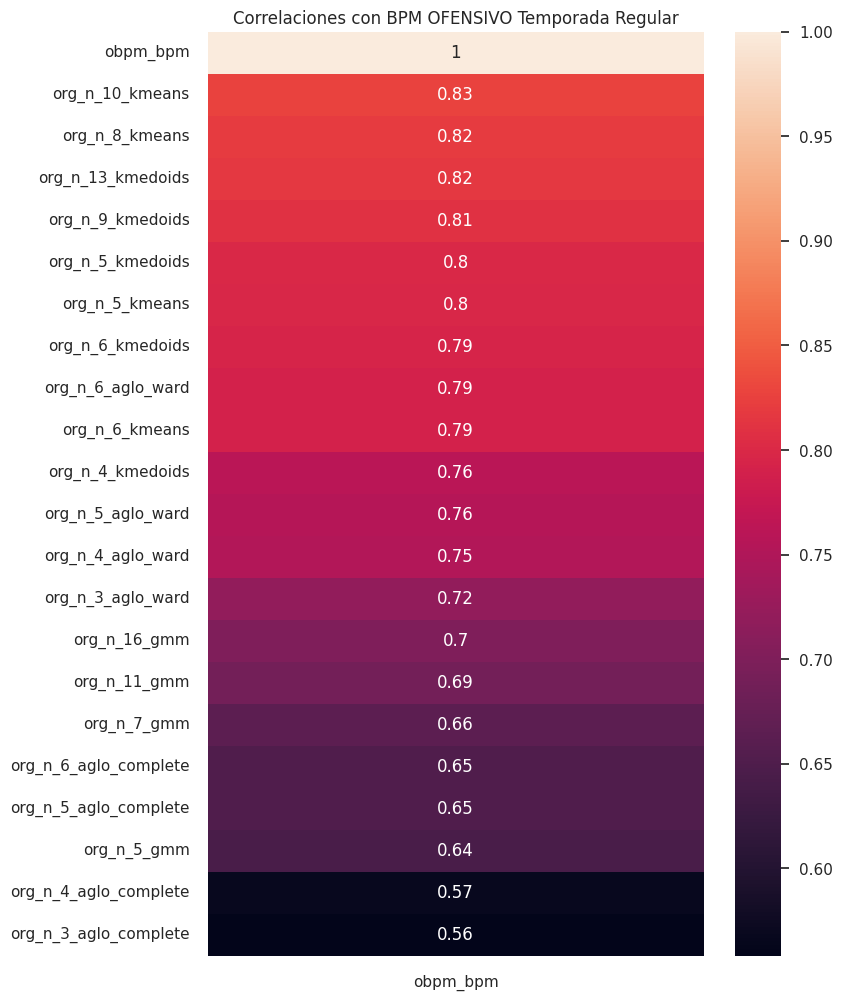

In [ ]:
# Mapa de calor para revisar correlaciones con variable DBPM

corr = organized_data_off[org_columns].corr(numeric_only = True)
dbpm_corr = corr[["obpm_bpm"]]
sbrn.set(rc = {'figure.figsize':(8, 12)})
heatmap = sbrn.heatmap(dbpm_corr.sort_values(by = ["obpm_bpm"], ascending = False), annot = True)
plt.title('Correlaciones con BPM OFENSIVO Temporada Regular')

In [ ]:
# Importación de archivo con data de playoffs

playoff_obpm_df = pd.read_csv(base_folder_string + 'off_ext_feature_analysis_newvar.csv')
playoff_obpm_df.shape

(4172, 114)

In [ ]:
playoff_obpm_df = playoff_obpm_df[['player', 'season', 'pos_bpm', 'obpm_playoffs']]

In [ ]:
off_arch_comp_merged = pd.merge(off_arch_comp_df, playoff_obpm_df, on = ['player', 'season'], how='inner', suffixes=('', '_drop'))

In [ ]:
off_arch_comp_merged.head(2)

,player,season,min,scor_ver,rim_pressure,pass_impact,onball_3pshoot,vorp_bpm,obpm_bpm,n_3_aglo_ward,...,org_n_5_kmedoids,org_n_6_kmedoids,org_n_9_kmedoids,org_n_13_kmedoids,org_n_5_gmm,org_n_7_gmm,org_n_11_gmm,org_n_16_gmm,pos_bpm,obpm_playoffs
0,Aaron McKie,1997,19.6,0.691204,0.107271,11.327563,0.076857,1.2,-1.1,1,...,1,1,2,6,3,5,7,10,2,-2.7
1,Adam Keefe,1997,14.8,0.622373,0.129864,5.032485,0.000000,0.2,-1.3,2,...,0,0,1,1,2,1,1,2,5,-1.7


In [ ]:
org_columns_playoffs = list(filter(lambda col: 'org_' in col, off_arch_comp_merged.columns))
added_poff_col = ['obpm_bpm','pos_bpm', 'obpm_playoffs']
for col in added_poff_col:
  org_columns_playoffs.append(col)

Text(0.5, 1.0, 'Correlaciones con BPM OFENSIVO Playoffs')

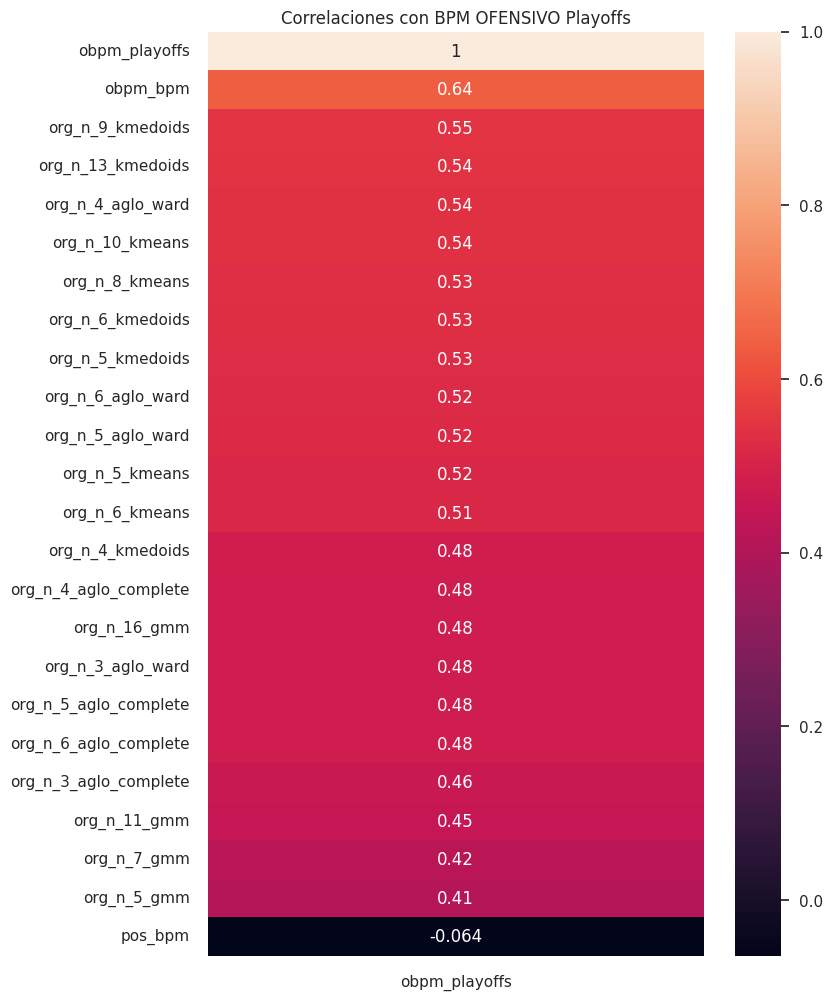

In [ ]:
# Mapa de calor para revisar correlaciones con variable DBPM PLAYOFFS

corr = off_arch_comp_merged[org_columns_playoffs].corr(numeric_only = True)
obpm_corr = corr[["obpm_playoffs"]]
sbrn.set(rc = {'figure.figsize':(8, 12)})
heatmap = sbrn.heatmap(obpm_corr.sort_values(by = ["obpm_playoffs"], ascending = False), annot = True)
plt.title('Correlaciones con BPM OFENSIVO Playoffs')

---
# 5.3. Análisis en resultados de clusters OFF (Qual)
---

In [69]:
# # KMEDIOIDS 0.55-0.81
kmedoids = KMedoids(n_clusters=off_clusnum_a, random_state=970120, init='k-medoids++')
kmedoids.fit(off_scaled)
y_kmedioids_off_a = kmedoids.labels_

In [70]:
y_kmedioids_off_a

array([3, 1, 3, ..., 3, 8, 5])

In [71]:
evaluation_columns = ['player', 'season', 'pos_bpm', 'min', 'ts%_adv', 'scoring_impact', 'rim_pressure',
                      'offball_2pshoot', 'offball_3pshoot', 'onball_3pshoot',
                      '3pshoot_impact', 'off_load', 'pass_impact',
                      'oreb_impact', 'scor_ver','obpm_bpm']

kmeans_off_arch = off_raw_df[evaluation_columns]

In [72]:
kmeans_off_arch = kmeans_off_arch.copy()
kmeans_off_arch["off_archetype_a"] = y_kmedioids_off_a
kmeans_off_arch = organize_clusters_by_median(kmeans_off_arch, cluster_columns=['off_archetype_a'], value_column=['obpm_bpm'], single_col=True)

In [73]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

off_arch_grouped = kmeans_off_arch.groupby('org_off_archetype_a').agg({
    'player': 'count',
    'min': 'mean',
    'scoring_impact': 'median',
    'rim_pressure': 'median',
    'off_load': 'median',
    '3pshoot_impact': 'median',
    'pass_impact': 'median',
    'oreb_impact': 'median',
    'scor_ver': 'median',
    'obpm_bpm': 'median',
}).reset_index()

off_arch_grouped['random_players'] = kmeans_off_arch.groupby('org_off_archetype_a')['player'].apply(lambda x: x.sample(n=3, random_state=970120).tolist())

In [74]:
off_arch_grouped.sort_values(by='obpm_bpm', ascending=False)

,org_off_archetype_a,player,min,scoring_impact,rim_pressure,off_load,3pshoot_impact,pass_impact,oreb_impact,scor_ver,obpm_bpm,random_players
8,8,494,36.50,27.11,0.55,6.25,0.16,26.00,0.22,1.94,4.40,"[LeBron James, Chris Bosh, Carmelo Anthony]"
7,7,583,31.35,22.40,0.23,3.32,0.38,24.21,0.10,1.37,2.30,"[Manu Ginobili, Rashard Lewis, Joe Crispin]"
6,6,460,32.12,22.97,0.49,3.19,0.01,11.16,0.89,1.45,1.70,"[Anthony Davis, Rasheed Wallace, Kevin Love]"
5,5,742,33.71,21.86,0.37,3.18,0.10,14.62,0.22,1.44,0.90,"[Ricky Davis, DeMarcus Cousins, Jordan Crawford]"
4,4,1963,26.61,19.29,0.19,1.80,0.15,11.72,0.14,0.99,-0.20,"[Deron Williams, Sebastian Telfair, Clifford R..."
3,3,1063,24.17,19.83,0.32,2.22,0.00,7.14,1.06,1.06,-0.40,"[Clarence Weatherspoon, Doug McDermott, Luis S..."
2,2,1624,18.73,17.52,0.08,0.91,0.22,7.06,0.12,0.71,-1.10,"[Derrick White, Sasha Pavlovic, Rodney McGruder]"
1,1,2217,14.08,16.84,0.12,1.68,0.00,5.20,0.83,0.73,-2.40,"[Vitaly Potapenko, Stojko Vrankovic, Lorenzen ..."
0,0,2384,13.22,13.65,0.05,1.25,0.07,6.69,0.16,0.62,-3.90,"[Ramon Sessions, Chris Singleton, Joel Przybilla]"


In [75]:
kmeans_off_arch["org_off_archetype_a"] = kmeans_off_arch["org_off_archetype_a"].astype(str)

In [76]:
# Gráfico comparativo de arquetipos

fig = px.scatter(kmeans_off_arch, x="scoring_impact", y="off_load", color="org_off_archetype_a", size="scor_ver", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Comparación en Arquetipos Ofensivos K-Medoids N9",
                 labels={"scoring_impact": "Impacto de Anotación", "off_load": "Carga Ofensiva", 'org_off_archetype_a': 'Arquetipo Ofensivo'},
                 hover_name="player")

# Show the Plotly figure
fig.show()

In [77]:
# Comentario
kmeans = KMeans(n_clusters=off_clusnum_b, random_state=970120, n_init=10)
kmeans.fit(off_scaled)
y_kmeans_off_b = kmeans.predict(off_scaled)

In [78]:
y_kmeans_off_b

array([4, 7, 4, ..., 1, 1, 5], dtype=int32)

In [79]:
evaluation_columns = ['player', 'season', 'pos_bpm', 'min', 'ts%_adv', 'scoring_impact', 'rim_pressure',
                      'offball_2pshoot', 'offball_3pshoot', 'onball_3pshoot',
                      '3pshoot_impact', 'off_load', 'pass_impact',
                      'oreb_impact', 'scor_ver','obpm_bpm']

kmeans_off_arch = off_raw_df[evaluation_columns]

In [80]:
kmeans_off_arch = kmeans_off_arch.copy()

kmeans_off_arch["off_archetype_b"] = y_kmeans_off_b
kmeans_off_arch = organize_clusters_by_median(kmeans_off_arch, cluster_columns=['off_archetype_b'], value_column=['obpm_bpm'], single_col=True)

In [81]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

off_arch_grouped = kmeans_off_arch.groupby('org_off_archetype_b').agg({
    'player': 'count',
    'min': 'mean',
    'scoring_impact': 'median',
    'rim_pressure': 'median',
    'off_load': 'median',
    '3pshoot_impact': 'median',
    'pass_impact': 'median',
    'oreb_impact': 'median',
    'scor_ver': 'median',
    'obpm_bpm': 'median',
}).reset_index()

off_arch_grouped['random_players'] = kmeans_off_arch.groupby('org_off_archetype_b')['player'].apply(lambda x: x.sample(n=3, random_state=97120).tolist())

In [82]:
off_arch_grouped.sort_values(by='obpm_bpm', ascending=False)

,org_off_archetype_b,player,min,scoring_impact,rim_pressure,off_load,3pshoot_impact,pass_impact,oreb_impact,scor_ver,obpm_bpm,random_players
9,9,117,34.98,28.98,0.38,5.10,0.53,30.65,0.11,1.86,5.40,"[Kemba Walker, Bradley Beal, Ray Allen]"
8,8,458,36.29,26.68,0.58,6.04,0.06,21.72,0.43,1.91,3.90,"[Domantas Sabonis, Kevin Garnett, Allen Iverson]"
7,7,867,34.09,22.38,0.32,3.57,0.20,22.77,0.13,1.44,2.00,"[Metta World Peace, Kirk Hinrich, Brandon Ingram]"
6,6,1241,29.61,21.54,0.39,2.68,0.01,9.34,0.77,1.29,0.50,"[Grant Hill, Clint Capela, Rodney Stuckey]"
5,5,1698,27.34,19.16,0.19,1.97,0.17,14.19,0.12,1.01,-0.20,"[Lou Williams, Damon Stoudamire, Jaden McDaniels]"
4,4,1509,19.33,18.09,0.07,0.90,0.27,7.33,0.11,0.75,-0.70,"[JR Bremer, Garrett Temple, Damon Jones]"
3,3,1445,18.51,18.33,0.20,1.67,0.00,5.80,1.05,0.82,-1.10,"[Lavoy Allen, DeAndre Jordan, Dikembe Mutombo]"
2,2,1680,16.25,17.30,0.12,1.82,0.06,6.95,0.28,0.82,-2.40,"[Henry Sims, Smush Parker, Joffrey Lauvergne]"
1,1,1729,13.56,13.80,0.07,1.17,0.03,5.50,0.32,0.58,-3.50,"[Grant Long, Grant Long, Isaiah Canaan]"
0,0,786,8.99,12.45,0.04,1.22,0.03,4.86,0.29,0.55,-5.50,"[Anderson Varejao, Jeremy Richardson, Isaac Bo..."


In [83]:
kmeans_off_arch["org_off_archetype_b"] = kmeans_off_arch["org_off_archetype_b"].astype(str)

In [84]:
# Gráfico comparativo de arquetipos

fig = px.scatter(kmeans_off_arch, x="scoring_impact", y="off_load", color="org_off_archetype_b", size="scor_ver", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Comparación en Arquetipos Ofensivos K-Means N10",
                 labels={"scoring_impact": "Impacto de Anotación", "off_load": "Carga Ofensiva", 'org_off_archetype_b': 'Arquetipo Ofensivo'},
                 hover_name="player")

# Show the Plotly figure
fig.show()

In [85]:
# # KMEDIOIDS 0.55-0.81
kmedoids = KMedoids(n_clusters=off_clusnum_c, random_state=970120, init='k-medoids++')
kmedoids.fit(off_scaled)
y_kmedioids_off_c = kmedoids.labels_

In [86]:
y_kmedioids_off_c

array([12, 10,  3, ...,  3,  8,  4])

In [87]:
evaluation_columns = ['player', 'season', 'min', 'scoring_impact', 'rim_pressure',
                      'offball_2pshoot', 'onball_3pshoot',
                      '3pshoot_impact', 'off_load', 'pass_impact',
                      'oreb_impact', 'scor_ver','obpm_bpm']

kmeans_off_arch = off_raw_df[evaluation_columns]

In [88]:
kmeans_off_arch = kmeans_off_arch.copy()
kmeans_off_arch["off_archetype_c"] = y_kmedioids_off_c
kmeans_off_arch = organize_clusters_by_median(kmeans_off_arch, cluster_columns=['off_archetype_c'], value_column=['obpm_bpm'], single_col=True)

In [89]:
# Agrupado basado en ARQUETIPOS DEFENSIVOS

off_arch_grouped = kmeans_off_arch.groupby('org_off_archetype_c').agg({
    'player': 'count',
    'min': 'mean',
    'scoring_impact': 'median',
    'rim_pressure': 'median',
    'off_load': 'median',
    '3pshoot_impact': 'median',
    'pass_impact': 'median',
    'oreb_impact': 'median',
    'scor_ver': 'median',
    'obpm_bpm': 'median',
}).reset_index()

off_arch_grouped['random_players'] = kmeans_off_arch.groupby('org_off_archetype_c')['player'].apply(lambda x: x.sample(n=3, random_state=970120).tolist())

In [90]:
off_arch_grouped.sort_values(by='obpm_bpm', ascending=False)

,org_off_archetype_c,player,min,scoring_impact,rim_pressure,off_load,3pshoot_impact,pass_impact,oreb_impact,scor_ver,obpm_bpm,random_players
12,12,310,37.01,28.07,0.58,6.91,0.15,25.87,0.24,2.04,4.90,"[De'Aaron Fox, Dirk Nowitzki, Joel Embiid]"
11,11,462,34.38,23.33,0.32,4.31,0.35,28.84,0.11,1.53,3.00,"[Tim Hardaway, Steve Nash, Kevin Porter ]"
10,10,316,34.01,24.50,0.57,4.11,0.01,14.02,0.87,1.60,2.40,"[Kevin Love, Amar'e Stoudemire, David Lee]"
9,9,580,33.77,22.33,0.38,3.31,0.07,13.88,0.31,1.52,1.00,"[Ramon Sessions, TJ Ford, Chris Kaman]"
8,8,762,29.75,21.60,0.26,2.15,0.20,11.74,0.17,1.19,0.80,"[Lou Williams, Chandler Parsons, Josh Richardson]"
7,7,790,25.97,20.27,0.34,2.24,0.00,7.55,1.17,1.07,0.20,"[Dale Davis, Emeka Okafor, Elden Campbell]"
6,6,1020,24.16,19.57,0.12,1.08,0.25,8.89,0.12,0.86,0.10,"[Kira Lewis , Jason Terry, Garrison Mathews]"
5,5,1029,26.30,18.13,0.18,2.23,0.15,17.55,0.10,0.96,-0.80,"[Jamaal Tinsley, Travis Best, Dale Ellis]"
4,4,768,23.81,18.24,0.23,1.96,0.01,7.25,0.63,1.07,-1.70,"[Tyrus Thomas, Yi Jianlian, Calbert Cheaney]"
3,3,1668,15.89,16.39,0.06,0.97,0.20,7.19,0.11,0.68,-1.90,"[James Jones, Draymond Green, James Johnson]"


In [91]:
kmeans_off_arch["org_off_archetype_c"] = kmeans_off_arch["org_off_archetype_c"].astype(str)

In [92]:
# Gráfico comparativo de arquetipos

fig = px.scatter(kmeans_off_arch, x="scoring_impact", y="off_load", color="org_off_archetype_c", size="scor_ver", color_discrete_sequence=px.colors.qualitative.Prism,
                 title="Comparación en Arquetipos Ofensivos K-Medoids N13",
                 labels={"scoring_impact": "Impacto de Anotación", "off_load": "Carga Ofensiva", 'org_off_archetype_c': 'Arquetipo Ofensivo'},
                 hover_name="player")

# Show the Plotly figure
fig.show()

---
# 5.4. Visualizaciones con T-SNE de clusters OFENSIVOS
---

In [93]:
# Create a DataFrame with embedded data and cluster labels
kmedioids_a_df = pd.DataFrame(embedded_offense_data, columns=['Dimension 1', 'Dimension 2'])
kmedioids_a_df['player_name'] = off_raw_df["player"]
kmedioids_a_df['obpm_bpm'] = off_raw_df["obpm_bpm"]
kmedioids_a_df['off_arch'] = y_kmedioids_off_a
kmedioids_a_df = organize_clusters_by_median(kmedioids_a_df, cluster_columns=['off_arch'], value_column=['obpm_bpm'], single_col=True)
kmedioids_a_df['org_off_arch'] = kmedioids_a_df['org_off_arch'].astype(str)

In [94]:
# Create a DataFrame with embedded data and cluster labels
kmeans_b_df = pd.DataFrame(embedded_offense_data, columns=['Dimension 1', 'Dimension 2'])
kmeans_b_df['player_name'] = off_raw_df["player"]
kmeans_b_df['obpm_bpm'] = off_raw_df["obpm_bpm"]
kmeans_b_df['off_arch'] = y_kmeans_off_b
kmeans_b_df = organize_clusters_by_median(kmeans_b_df, cluster_columns=['off_arch'], value_column=['obpm_bpm'], single_col=True)
kmeans_b_df['org_off_arch'] = kmeans_b_df['org_off_arch'].astype(str)

In [95]:
# Create a DataFrame with embedded data and cluster labels
kmedioids_c_df = pd.DataFrame(embedded_offense_data, columns=['Dimension 1', 'Dimension 2'])
kmedioids_c_df['player_name'] = off_raw_df["player"]
kmedioids_c_df['obpm_bpm'] = off_raw_df["obpm_bpm"]
kmedioids_c_df['off_arch'] = y_kmedioids_off_c
kmedioids_c_df = organize_clusters_by_median(kmedioids_c_df, cluster_columns=['off_arch'], value_column=['obpm_bpm'], single_col=True)
kmedioids_c_df['org_off_arch'] = kmedioids_c_df['org_off_arch'].astype(str)

In [ ]:
# Gráfico de arquetipos sobre T-SNE usando Plotly

fig = px.scatter(
    kmedioids_a_df, x='Dimension 1', y='Dimension 2', color='org_off_arch',
    labels={'org_off_arch': 'Arquetipo Ofensivo'},
    hover_data=['player_name'],
    title='T-SNE Ofensivo K-MEDOIDS N9'
)

fig.show()

In [ ]:
# Gráfico de arquetipos sobre T-SNE usando Plotly

fig = px.scatter(
    kmeans_b_df, x='Dimension 1', y='Dimension 2', color='org_off_arch',
    labels={'org_def_arch': 'Arq. Ofensivo'},
    hover_data=['player_name'],
    title='T-SNE Ofensivo K-MEANS N10'
)

fig.show()

In [ ]:
# Gráfico de arquetipos sobre T-SNE usando Plotly

fig = px.scatter(
    kmedioids_c_df, x='Dimension 1', y='Dimension 2', color='org_off_arch',
    labels={'org_def_arch': 'Arq. Ofensivo'},
    hover_data=['player_name'],
    title='T-SNE Ofensivo K-MEDOIDS N13'
)

fig.show()

In [96]:
# Exportación de archivo con clústeres ofensivos seleccionados
off_archetype_names = kmeans_off_arch[['player', 'season']]
off_archetype_names['off_arch'] = y_kmedioids_off_c

In [97]:
off_archetype_names.shape

(11530, 3)

In [98]:
# Exportación de archivo con clústeres ofensivos seleccionados
off_archetype_names.to_csv(base_folder_string + 'off_archetypes_poise.csv', index=False)